# Scratch Detection Assignment
Scratch Detection Assignment for a student position in the data science team at NI

<img src="assets/NI_logo.png" width="100" height="100">
Before you start working on this assignment, make sure you meet the prerequisites below: <a href="https://hdjq.fa.us2.oraclecloud.com/hcmUI/CandidateExperience/en/sites/CX_1/job/25017214">Machine Learning Engineer Student Job Description</a>

**Main mandatory requirements:**

- Studying for M.Sc/B.Sc in Computer Science or related technical discipline( M.Sc is a big advantage)
- Remaining studies of at least one and a half years.
- Availability for 3-4 working days a week.
## New Section
## Introduction:

In the semiconductor industry, **"wafers"** are thin discs of semiconductor material, such as silicon, used to fabricate microelectronic devices such as transistors, integrated circuits, and other components. A single wafer can contain hundreds or thousands of individual devices, known as **"dies"**, which are typically cut or "diced" from the wafer after the manufacturing process is completed.

You can read more about semiconductor here: <a href="https://web.archive.org/web/20230115132446/https://www.amd.com/en/technologies/introduction-to-semiconductors//">Introduction to Semiconductors</a>

<figure>
  <img src="assets/wafer.jpeg" width="350" height="280">
  <figcaption>Fig.1 - An example of a standard wafer</figcaption>
</figure>

One of the challenges in manufacturing wafers is to identify and isolate defects, including scratches, which can affect the performance and reliability of the resulting devices.

Scratches are seen as elongated clusters of bad dies that have a high aspect ratio, meaning they are relatively thin and long compared to their width. They can be caused by equipment misalignment or mishandling by humans, and may contain latent defects that can affect the performance of the devices. Scratches may not always be continuous, so sometimes there may be good dies within the scratch. These good dies are often marked for removal in a manual process called "**Inked dies**"

<figure>
  <img src="assets/scratch.png">
  <figcaption>Fig.2 - A scratch on a wafer - an optical view</figcaption>
</figure>

In the data that you receive, there may be faulty dies that are part of a scratch, which are labeled as "Scratch" as well as a few good dies that are part of a scratch, which are labeled as "Ink."

Many times, the Scratch Detection process will be done on the logical wafer map and not on a visual image of it.

The data that you received is called **"wafer map"** as it maps the status of all dies in the wafer.

The dies in the wafers are tested in a large number of stations, operations, and in each operation it is possible to create a map of the dies in this operation by coloring the good dies in a certain color and the faulty dies in another color.

<figure>
  <img src="assets/wafer_map.png" width="300" height="300">
  <figcaption>Fig.3 - A logical wafer map in a certain operation. good dies in green and bad dies in red</figcaption>
</figure>

Did you notice a scratch on this wafer?

Well, with our eyes it is easy to notice the scratch that comes out from the right side in the center of the wafer.

Note, that this scratch is not continuous, meaning, not all the dies which are placed on this scratch are considered faults in this operation. We have to identify all scracthed dies including bad & good. The good dies that are part of the scartch have to be itendified actively in order to be killed. This process is called "inking".

We kill them because we fear that a physical scratch on the silicon wafer is what caused the sequence of these faulty dies, therefore even dies that passed the tests may be of low quality because they were damaged by the scratch on which they are placed.

<figure>
  <img src="assets/wafer_map_with_marks.png" width="300" height="300">
  <figcaption>Fig.4 - A wafer map in a certain operation with scratch detection marks. good dies in grenn, bad dies in red, scratch in blue, ink in yellow</figcaption>
</figure>

You can read more about the causes of die failures here: <a href="https://semiengineering.com/why-chips-die//">Why Chips Die</a>

## Assignment description

In this assignment you are receiving wafer maps in a certain operation and the goal is to predict whether a given die belongs to scratch or not.

The data includes information about individual dies from a number of wafers.

The table data includes the following columns:

-  `WaferName` : The name of the wafer from which the die came.
- `DieX`: The horizontal position of the die on the wafer.
- `DieY`: The vertical position of the die on the wafer.
- `IsGoodDie`: A binary column indicating whether the die is good or not.
- `IsScratchDie`: A binary column indicating whether the die belongs to a scratch or not.

Your goal is to use the training data to build a model that can predict, given a certain wafer map, the dies on the map that are parts of a scratch (whether they are bad, 'Scratch' or good, 'Ink').

*The purpose of the assignment is mainly to get to reasonable solution that can help the business. Please note that real industry solutions usually achieve lower scores than you may be used from academic problems so even a low metric score on the test set may be considered a success*

Business goals:

- **Automation**. This process is currently a manual and expensive procedure that takes a lot of time and is prone to errors by the tagger. The goal is to perform this procedure in a faster time and save the costs of the test
- **Quality**. increasing the quality of the dies while balancing quality and yield (on the one hand, not to miss scratches, on the other hand not to do too much "Ink")
- **Prediction Level**. As explained above, the main goal is to detect individual dies, but sometimes it will help to also get a classification at the wafer level, (binary classification, is there a scratch on this wafer or not?) because there are manufacturers who return scratched wafers to the factory.

**Note**. In wafers with a low yield (that is, a lot of faulty dies), we will **not** perform scratch detection because the customer is afraid to find randomly generated scratches there and perform unnecessary ink. In such cases, the customer will make sure to check all the dies strictly in any case, but regardless of the detection of scratches. Therefore, in these cases we will not consider a sequence of bad die to be scratch.

You are free to use any machine learning technique you find appropiate for solving this problem. Make sure choosing the relevamt metrics to test your solutions's performance.

In addition to the training data, you are given a test set, which includes the x and y coordinates and the good/not status of each die, but does not include the scratch/not scratch labels.

You are asked to use your model to predict the scratch/not scratch status of the dies in the test set, and to save the predictions in a CSV file. You should submit your notebook including the experiments you did along the way to improve the model/various methods you tried and including your final model.

Pay attention to the following points:

- Exploratoration and analyze the data
- Consideration of business goals
- Selection of relevant machine learning models
- Appropriate choice of metrics

## Submission

1. After completing the assignment please review your notebook, making sure it ran properly from start to finish
2. Create the prediction column for the test set as described in the notebook and save the results to a CVS file
3. Send an email to the following:
    - tomer.zemelman@emerson.com
    - The email should include a zip file with your notebook and a CSV file with the prediction.
4. After receiving the email with the assignment we will inform you about the next steps


Good Luck!

# Start work

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
from datetime import datetime

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import DataLoader, Dataset

# sklearn
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
    precision_score,
    recall_score
)

from itertools import product

### Load Data

In [ ]:
#load zip file
zf = zipfile.ZipFile('data.zip')

In [ ]:
#load train data
df_wafers = pd.read_csv(zf.open('wafers_train.csv'))
df_wafers.head()

,WaferName,DieX,DieY,IsGoodDie,IsScratchDie
0,8PFrAN,0,27,True,False
1,8PFrAN,0,28,True,False
2,8PFrAN,0,29,True,False
3,8PFrAN,0,30,True,False
4,8PFrAN,0,31,True,False


In [ ]:
#load test data
df_wafers_test = pd.read_csv(zf.open('wafers_test.csv'))
df_wafers_test.head()

,WaferName,DieX,DieY,IsGoodDie
0,mZa9ls,0,23,True
1,mZa9ls,0,24,True
2,mZa9ls,0,25,True
3,mZa9ls,0,26,True
4,mZa9ls,0,27,True


You can draw the wafers map to see how the wafers look like in the data.

Using the following helper function you can draw the wafer maps with or without labels:

In [ ]:
def plot_wafer_maps(wafer_df_list, figsize, labels = True):
    """
    plot wafer maps for list of df of wafers

    :param wafer_df_list: list, The list of df's of the wafers
    :param figsize: int, the size of the figsize height
    :param labels: bool, Whether to show the layer of labels (based on column 'IsScratchDie')

    :return: None
    """
    def plot_wafer_map(wafer_df, ax, map_type):
        wafer_size = len(wafer_df)
        s = 2**17/(wafer_size)
        if map_type == 'Label':
            mes = 'Scratch Wafer' if (wafer_df['IsScratchDie'] == True).sum()>0 else 'Non-Scratch Wafer'
        else:
            mes = 'Yield: ' + str(round((wafer_df['IsGoodDie']).sum()/(wafer_df['IsGoodDie']).count(), 3))

        ax.set_title(f'{map_type} | Wafer Name: {wafer_df["WaferName"].iloc[0]}, \nSum: {len(wafer_df)} dies. {mes}', fontsize=20)
        ax.scatter(wafer_df['DieX'], wafer_df['DieY'], color = 'green', marker='s', s = s)

        bad_bins = wafer_df.loc[wafer_df['IsGoodDie'] == False]
        ax.scatter(bad_bins['DieX'], bad_bins['DieY'], color = 'red', marker='s', s = s)

        if map_type == 'Label':
            scratch_bins = wafer_df.loc[(wafer_df['IsScratchDie'] == True) & (wafer_df['IsGoodDie'] == False)]
            ax.scatter(scratch_bins['DieX'], scratch_bins['DieY'], color = 'blue', marker='s', s = s)

            ink_bins = wafer_df.loc[(wafer_df['IsScratchDie'] == True) & (wafer_df['IsGoodDie'] == True)]
            ax.scatter(ink_bins['DieX'], ink_bins['DieY'], color = 'yellow', marker='s', s = s)

            ax.legend(['Good Die', 'Bad Die', 'Scratch Die', 'Ink Die'], fontsize=8)
        else:
            ax.legend(['Good Die', 'Bad Die'], fontsize=8)

        ax.axes.get_xaxis().set_visible(False)
        ax.axes.get_yaxis().set_visible(False)

    import numpy as np
    import matplotlib.pyplot as plt

    if labels:
        fig, ax = plt.subplots(2, len(wafer_df_list), figsize=(figsize*len(wafer_df_list), figsize*2))
        for idx1, wafer_df in enumerate(wafer_df_list):
            for idx2, map_type in enumerate(['Input', 'Label']):
                plot_wafer_map(wafer_df, ax[idx2][idx1], map_type)
    else:
        fig, ax = plt.subplots(1, len(wafer_df_list), figsize=(figsize*len(wafer_df_list), figsize))
        for idx, wafer_df in enumerate(wafer_df_list):
            plot_wafer_map(wafer_df, ax[idx], 'Input')

    plt.show()

Select the amount of samples you want to display:

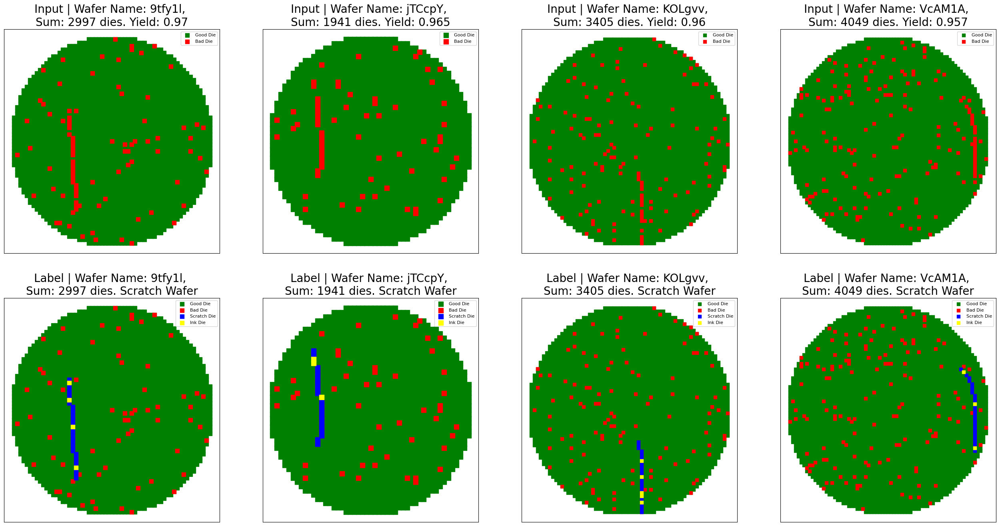

In [ ]:
n_samples = 4
list_sample_train = [df_wafers.groupby('WaferName').get_group(group) for group in df_wafers['WaferName'].value_counts().sample(n_samples, random_state=20).index]
plot_wafer_maps(list_sample_train, figsize = 8, labels = True)

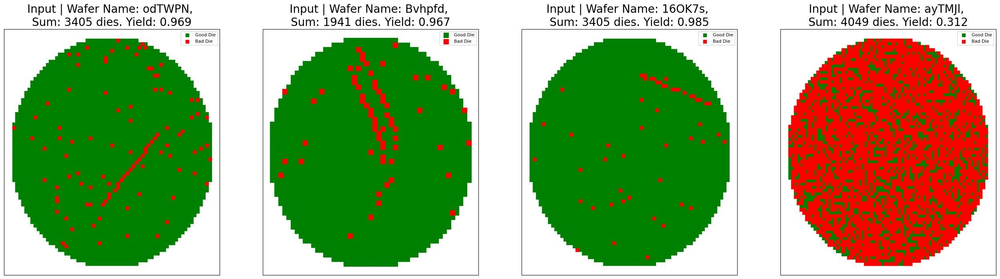

In [ ]:
n_samples = 4
for i in range(1):
    list_sample_test = [df_wafers_test.groupby('WaferName').get_group(group) for group in df_wafers_test['WaferName'].value_counts().sample(n_samples).index]
    plot_wafer_maps(list_sample_test, figsize = 8, labels = False)

# Build your solution

Number of unique wafers: 455

Missing values per column:
WaferName    0
DieX         0
DieY         0
IsGoodDie    0
dtype: int64

Descriptive statistics:
       WaferName          DieX          DieY IsGoodDie
count    1128335  1.128335e+06  1.128335e+06   1128335
unique       455           NaN           NaN         2
top       eJT0xe           NaN           NaN      True
freq        4049           NaN           NaN   1038877
mean         NaN  2.892736e+01  2.892736e+01       NaN
std          NaN  1.603044e+01  1.603044e+01       NaN
min          NaN  0.000000e+00  0.000000e+00       NaN
25%          NaN  1.600000e+01  1.600000e+01       NaN
50%          NaN  2.800000e+01  2.800000e+01       NaN
75%          NaN  4.100000e+01  4.100000e+01       NaN
max          NaN  7.000000e+01  7.000000e+01       NaN


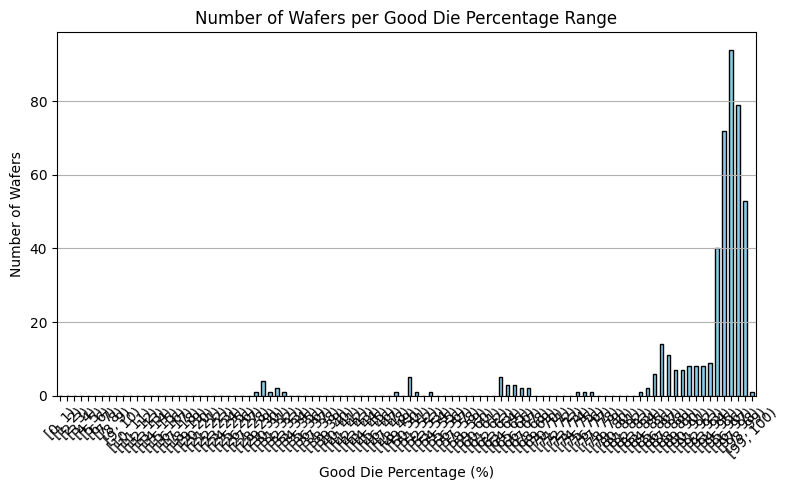

[0-1]: 0
[1-2]: 0
[2-3]: 0
[3-4]: 0
[4-5]: 0
[5-6]: 0
[6-7]: 0
[7-8]: 0
[8-9]: 0
[9-10]: 0
[10-11]: 0
[11-12]: 0
[12-13]: 0
[13-14]: 0
[14-15]: 0
[15-16]: 0
[16-17]: 0
[17-18]: 0
[18-19]: 0
[19-20]: 0
[20-21]: 0
[21-22]: 0
[22-23]: 0
[23-24]: 0
[24-25]: 0
[25-26]: 0
[26-27]: 0
[27-28]: 0
[28-29]: 1
[29-30]: 4
[30-31]: 1
[31-32]: 2
[32-33]: 1
[33-34]: 0
[34-35]: 0
[35-36]: 0
[36-37]: 0
[37-38]: 0
[38-39]: 0
[39-40]: 0
[40-41]: 0
[41-42]: 0
[42-43]: 0
[43-44]: 0
[44-45]: 0
[45-46]: 0
[46-47]: 0
[47-48]: 0
[48-49]: 1
[49-50]: 0
[50-51]: 5
[51-52]: 1
[52-53]: 0
[53-54]: 1
[54-55]: 0
[55-56]: 0
[56-57]: 0
[57-58]: 0
[58-59]: 0
[59-60]: 0
[60-61]: 0
[61-62]: 0
[62-63]: 0
[63-64]: 5
[64-65]: 3
[65-66]: 3
[66-67]: 2
[67-68]: 2
[68-69]: 0
[69-70]: 0
[70-71]: 0
[71-72]: 0
[72-73]: 0
[73-74]: 0
[74-75]: 1
[75-76]: 1
[76-77]: 1
[77-78]: 0
[78-79]: 0
[79-80]: 0
[80-81]: 0
[81-82]: 0
[82-83]: 0
[83-84]: 1
[84-85]: 2
[85-86]: 6
[86-87]: 14
[87-88]: 11
[88-89]: 7
[89-90]: 7
[90-91]: 8
[91-92]: 8
[92-9

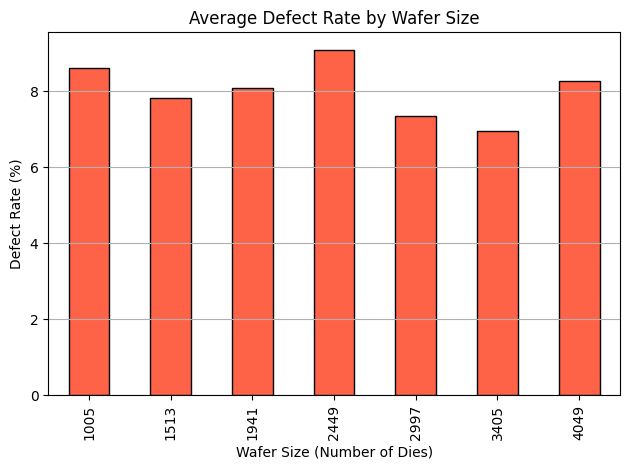

WaferSize
1005    8.604669
1513    7.830596
1941    8.079895
2449    9.096334
2997    7.347347
3405    6.960804
4049    8.261489
Name: IsGoodDie, dtype: float64
Min/Max DieX and DieY by Wafer Size:
           min_DieX  max_DieX  min_DieY  max_DieY
WaferSize                                        
1005              0        34         0        34
1513              0        42         0        42
1941              0        48         0        48
2449              0        54         0        54
2997              0        60         0        60
3405              0        64         0        64
4049              0        70         0        70

Wafers in 0%-88% yield range (sorted):
           yield_percent
WaferName               
Ar9QwZ         28.705594
IKRzN5         29.263266
WpfSfc         29.318089
ZW3dC7         29.896563
KnR98o         29.958014
...                  ...
a339LH         87.562189
xFe4Xa         87.640449
oAVzNv         87.838731
GIr8vF         87.929515
TXwLzV      

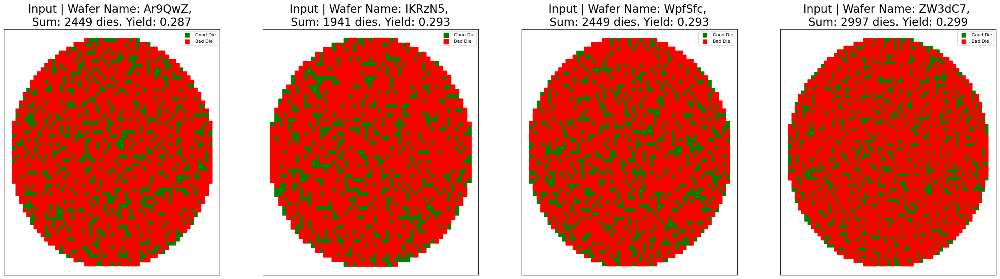

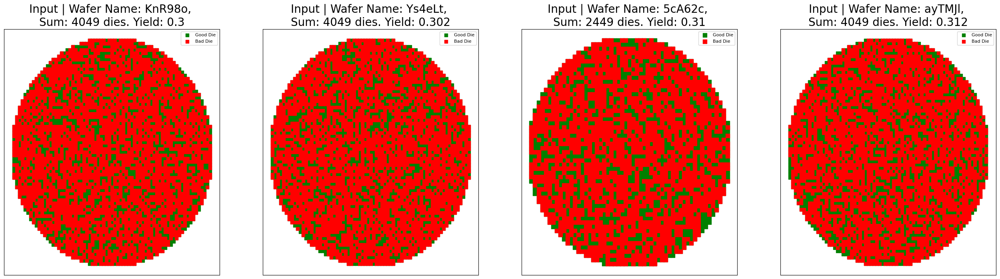

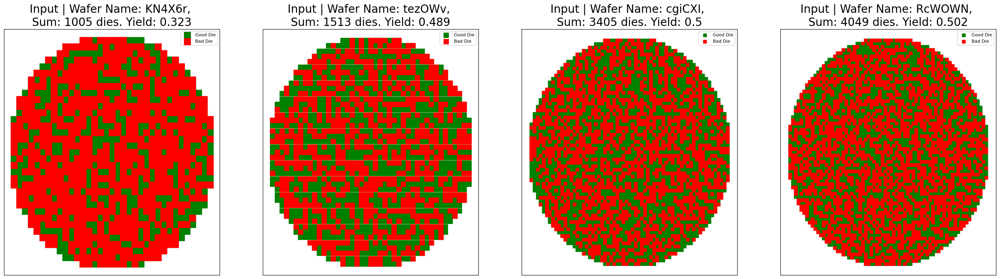

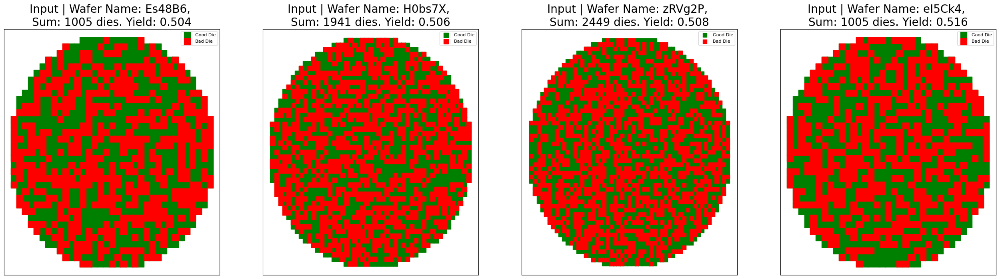

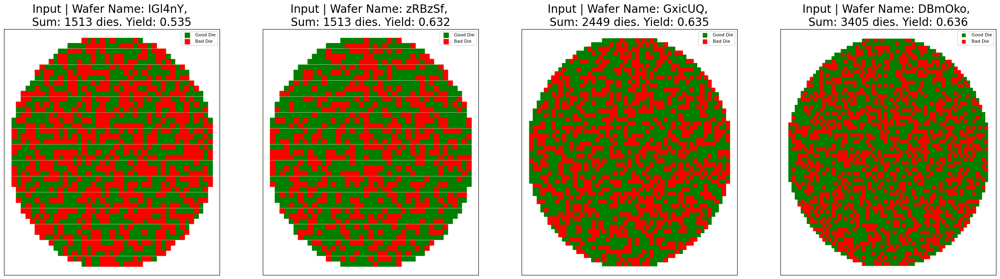

...

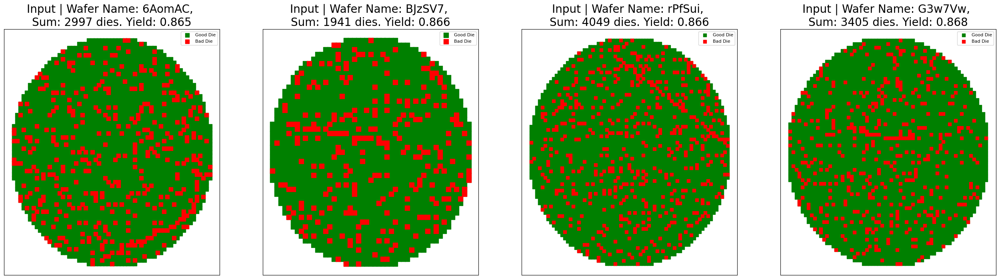

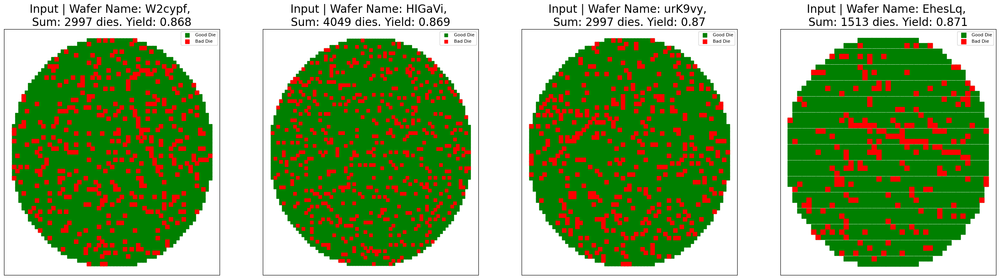

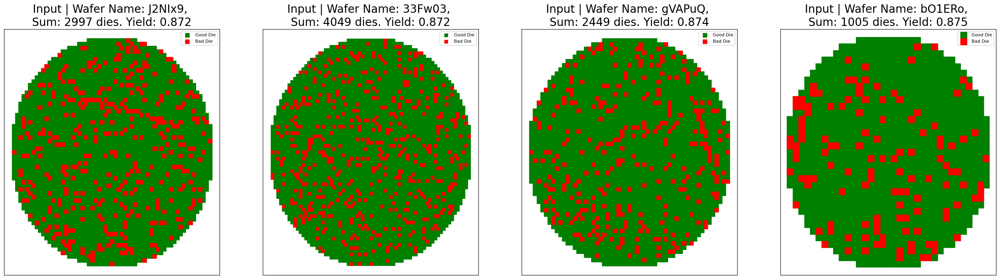

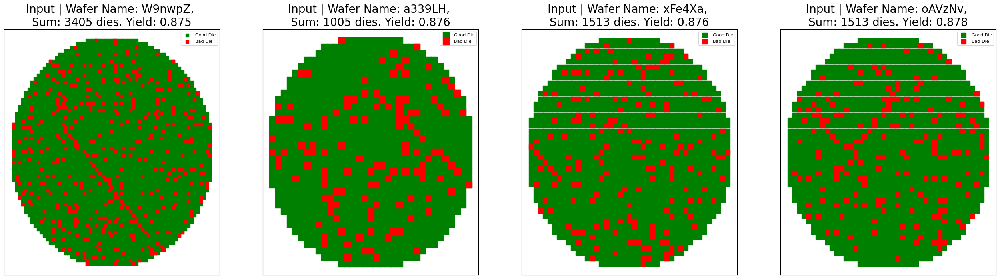

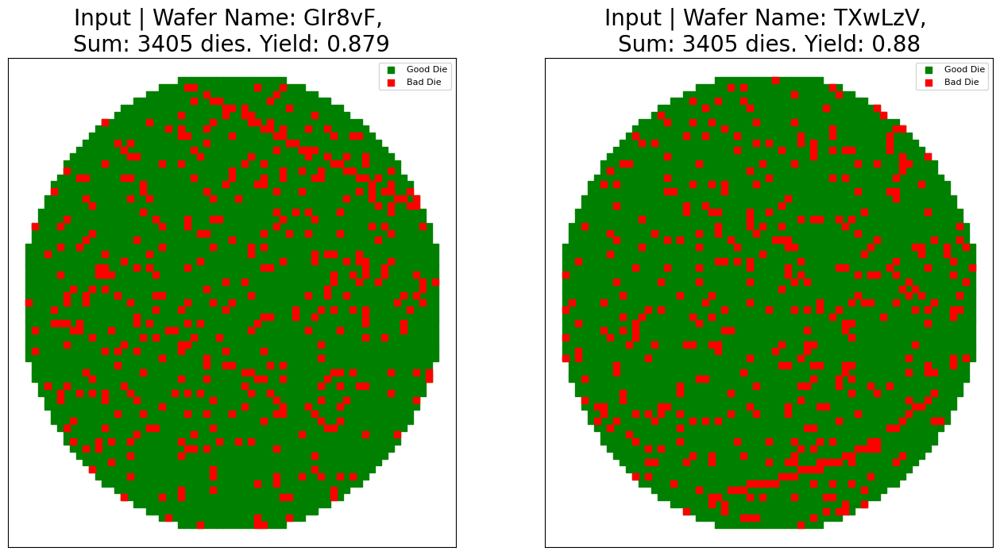

In [ ]:
#TODO build your solution
#EDA: for testset
num_wafers = df_wafers_test['WaferName'].nunique()
print(f"Number of unique wafers: {num_wafers}")

# Check for missing values
print("\nMissing values per column:")
print(df_wafers_test.isnull().sum())

# Basic statistics
print("\nDescriptive statistics:")
print(df_wafers_test.describe(include='all'))

# Recalculate wafer yield percentage
wafer_yield = df_wafers_test.groupby('WaferName').agg(
    total=('IsGoodDie', 'count'),
    good=('IsGoodDie', lambda x: (x == True).sum())
)
wafer_yield['yield_percent'] = 100 * wafer_yield['good'] / wafer_yield['total']

# Count how many wafers fall into each yield percentage range (binning)
start_b = 0
bin_edges = range(start_b, 101)  # Bins from 0% to 100%
wafer_yield['yield_bin'] = pd.cut(wafer_yield['yield_percent'], bins=bin_edges, right=False)

# Count number of wafers per bin
bin_counts = wafer_yield['yield_bin'].value_counts().sort_index()

# Plotting: X = good die percentage range, Y = number of wafers
plt.figure(figsize=(8, 5))
bin_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Number of Wafers per Good Die Percentage Range")
plt.xlabel("Good Die Percentage (%)")
plt.ylabel("Number of Wafers")
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


for amount in bin_counts:
    print(f"[{start_b}-{start_b+1}]: {amount}")
    start_b += 1




unique_sizes = {}
for size in df_wafers_test.groupby('WaferName')['DieX'].count():
    if size not in unique_sizes:
        unique_sizes[size] = 1
    else:
        unique_sizes[size] += 1

print("Exact sizes and wafer counts:")
for size in sorted(unique_sizes):
    print(f"Wafer size: {size} dies -> {unique_sizes[size]} wafers")


# First: create a new column with wafer size per row
wafer_sizes = df_wafers_test.groupby('WaferName')['DieX'].count().to_dict()
df_wafers_test['WaferSize'] = df_wafers_test['WaferName'].map(wafer_sizes)

# Now calculate defect rate per size
defect_rates = df_wafers_test.groupby('WaferSize')['IsGoodDie'].apply(lambda x: 100 * (x == False).sum() / x.count())

# Plot
defect_rates.sort_index().plot(kind='bar', color='tomato', edgecolor='black')
plt.title("Average Defect Rate by Wafer Size")
plt.xlabel("Wafer Size (Number of Dies)")
plt.ylabel("Defect Rate (%)")
plt.grid(axis='y')
plt.tight_layout()
plt.show()

print(defect_rates.sort_index())


# Calculate min/max DieX and DieY for each wafer size
wafer_bounds = df_wafers_test.groupby("WaferSize").agg(
    min_DieX=('DieX', 'min'),
    max_DieX=('DieX', 'max'),
    min_DieY=('DieY', 'min'),
    max_DieY=('DieY', 'max')
)

# Display
print("Min/Max DieX and DieY by Wafer Size:")
print(wafer_bounds)



wafer_subset = wafer_yield[
    ((wafer_yield['yield_percent'] >= 0) & (wafer_yield['yield_percent'] < 88.1))
].copy()

# Sort by yield (ascending)
wafer_subset = wafer_subset.sort_values(by='yield_percent')

print("\nWafers in 0%-88% yield range (sorted):")
print(wafer_subset[['yield_percent']])

# Extract die data
df_low_yield_wafers = df_wafers_test[df_wafers_test['WaferName'].isin(wafer_subset.index)]

# Split into chunks of 4 for plotting
wafer_names = list(wafer_subset.index)
chunk_size = 4
for i in range(0, len(wafer_names), chunk_size):
    chunk_names = wafer_names[i:i+chunk_size]
    wafer_dfs = [df_low_yield_wafers[df_low_yield_wafers['WaferName'] == name] for name in chunk_names]
    plot_wafer_maps(wafer_dfs, figsize=8, labels=False)

Number of unique wafers: 4200

Missing values per column:
WaferName       0
DieX            0
DieY            0
IsGoodDie       0
IsScratchDie    0
dtype: int64

Descriptive statistics:
       WaferName          DieX          DieY IsGoodDie IsScratchDie
count   10415400  1.041540e+07  1.041540e+07  10415400     10415400
unique      4200           NaN           NaN         2            2
top       3ww3gn           NaN           NaN      True        False
freq        4049           NaN           NaN  10036478     10335081
mean         NaN  2.892736e+01  2.892736e+01       NaN          NaN
std          NaN  1.603043e+01  1.603043e+01       NaN          NaN
min          NaN  0.000000e+00  0.000000e+00       NaN          NaN
25%          NaN  1.600000e+01  1.600000e+01       NaN          NaN
50%          NaN  2.800000e+01  2.800000e+01       NaN          NaN
75%          NaN  4.100000e+01  4.100000e+01       NaN          NaN
max          NaN  7.000000e+01  7.000000e+01       NaN          Na

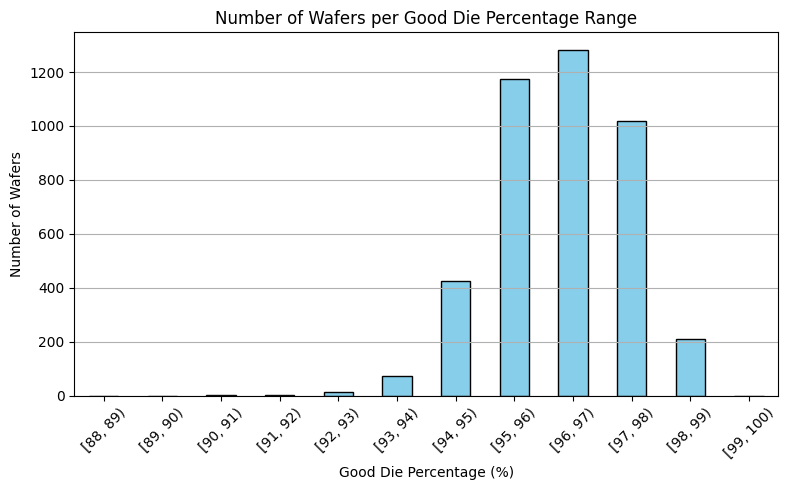

[88-89]: 0
[89-90]: 0
[90-91]: 1
[91-92]: 1
[92-93]: 13
[93-94]: 75
[94-95]: 424
[95-96]: 1173
[96-97]: 1283
[97-98]: 1018
[98-99]: 212
[99-100]: 0

 Avg. Good Die % by Scratch Presence:
HasScratch
False    0.969892
True     0.156476
Name: IsGoodDie, dtype: float64


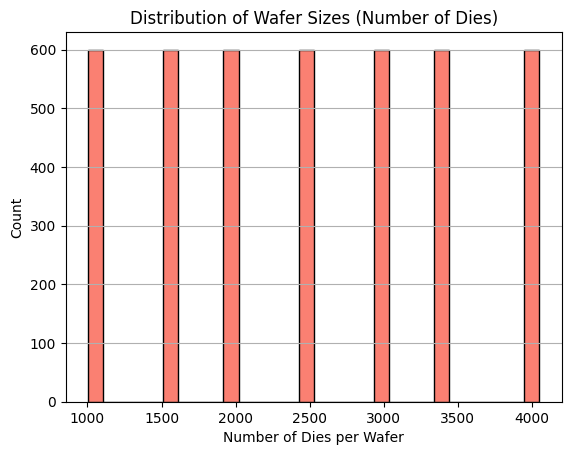

Exact sizes and wafer counts:
Wafer size: 1005 dies -> 600 wafers
Wafer size: 1513 dies -> 600 wafers
Wafer size: 1941 dies -> 600 wafers
Wafer size: 2449 dies -> 600 wafers
Wafer size: 2997 dies -> 600 wafers
Wafer size: 3405 dies -> 600 wafers
Wafer size: 4049 dies -> 600 wafers


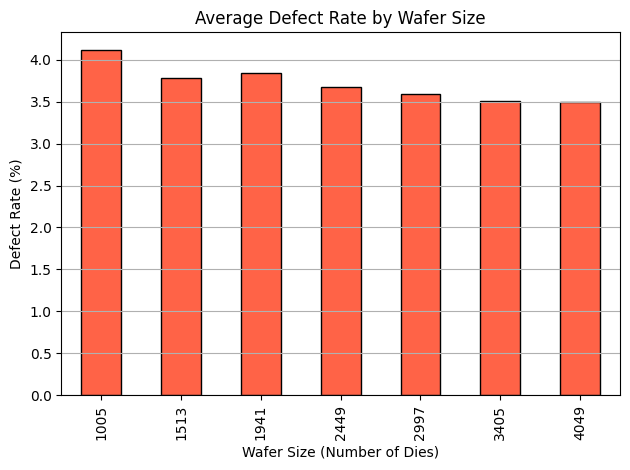

WaferSize
1005    4.118905
1513    3.780458
1941    3.840975
2449    3.676807
2997    3.588533
3405    3.508566
4049    3.490491
Name: IsGoodDie, dtype: float64


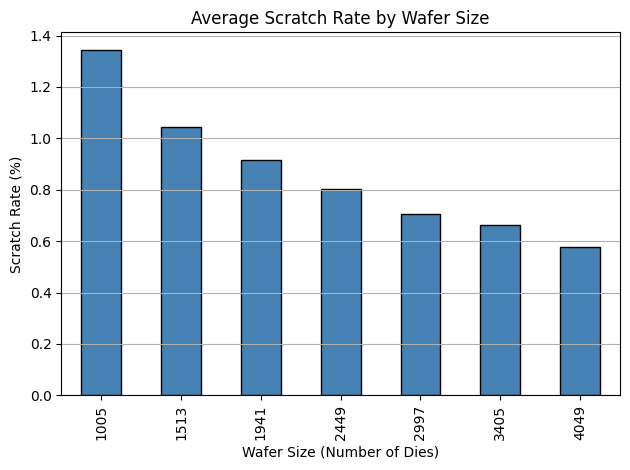

Min/Max DieX and DieY by Wafer Size:
           min_DieX  max_DieX  min_DieY  max_DieY
WaferSize                                        
1005              0        34         0        34
1513              0        42         0        42
1941              0        48         0        48
2449              0        54         0        54
2997              0        60         0        60
3405              0        64         0        64
4049              0        70         0        70
WaferSize
1005    1.345439
1513    1.046156
1941    0.914219
2449    0.803866
2997    0.704760
3405    0.664121
4049    0.576644
Name: IsScratchDie, dtype: float64

Wafers in 90%-93%, 95.7%-95.8%, 98.85%-99% yield range (sorted):
           yield_percent
WaferName               
sNyWi7         90.019828
AvM0iw         91.243781
wgSX4O         92.338308
pzHlrt         92.375064
YouPKd         92.437811
...                  ...
b49oNX         95.795796
qv2AAA         95.795796
33gCNW         95.795796
7XgncK  

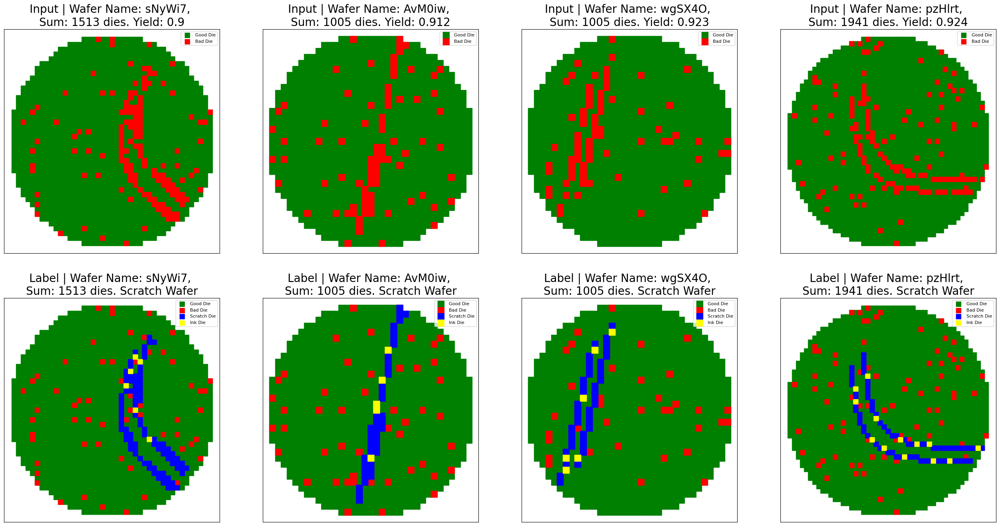

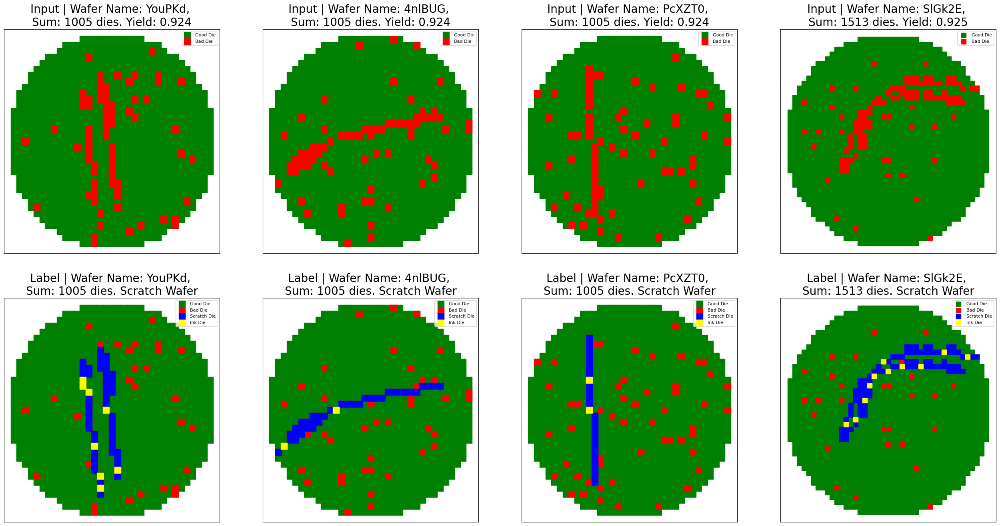

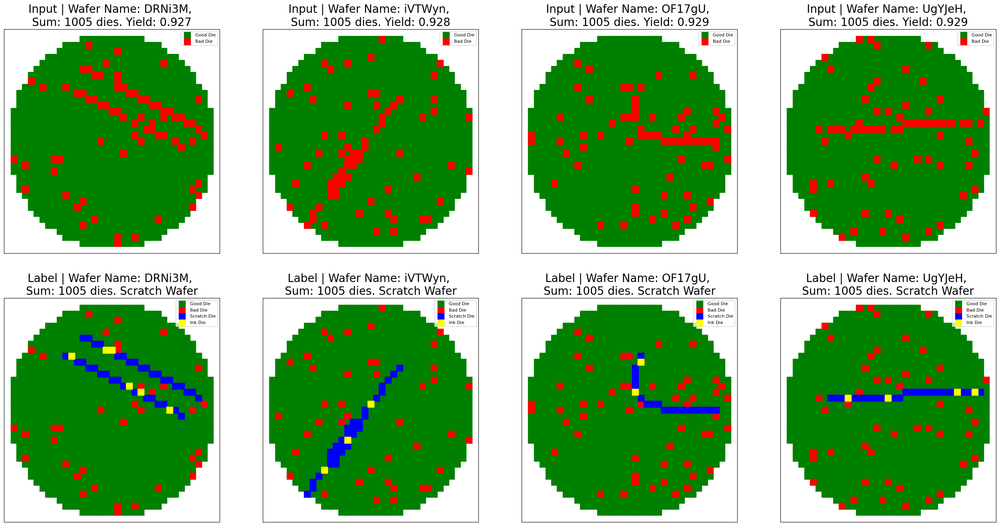

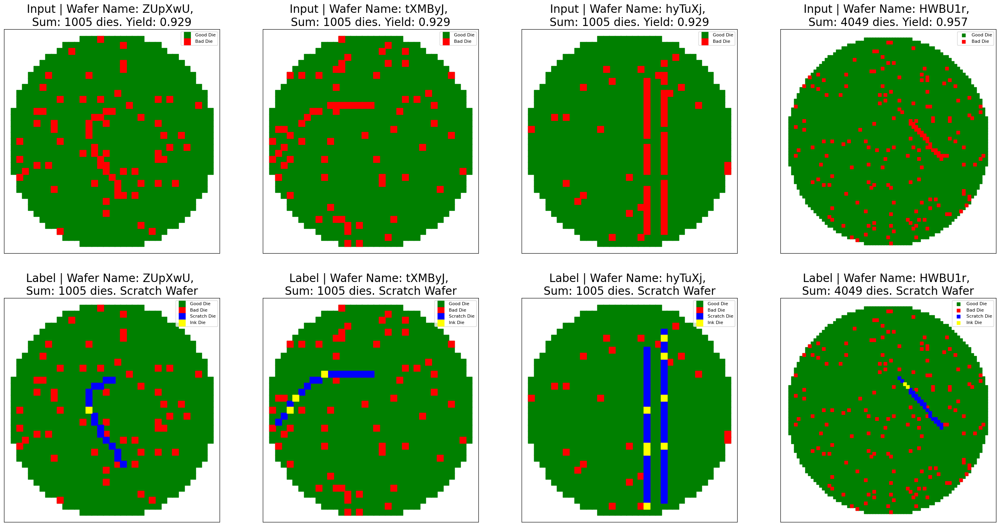

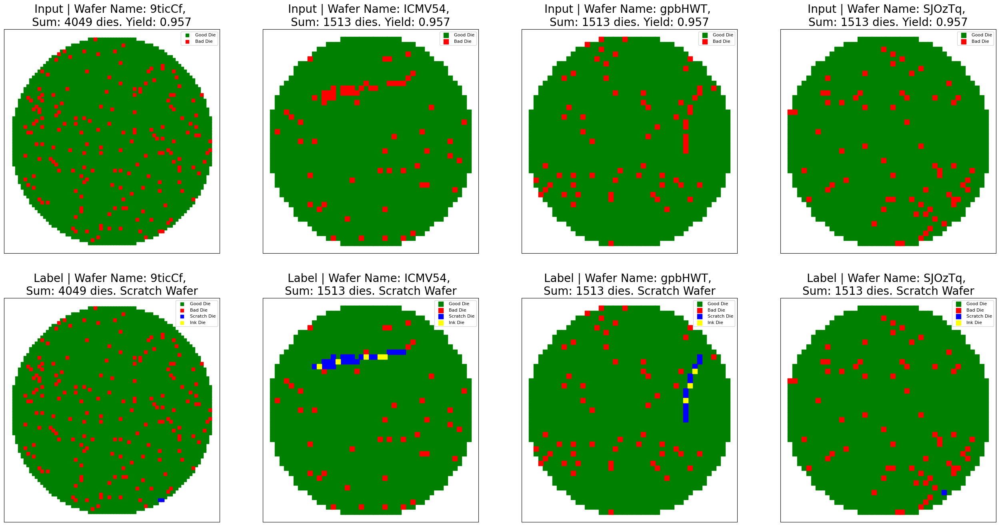

...

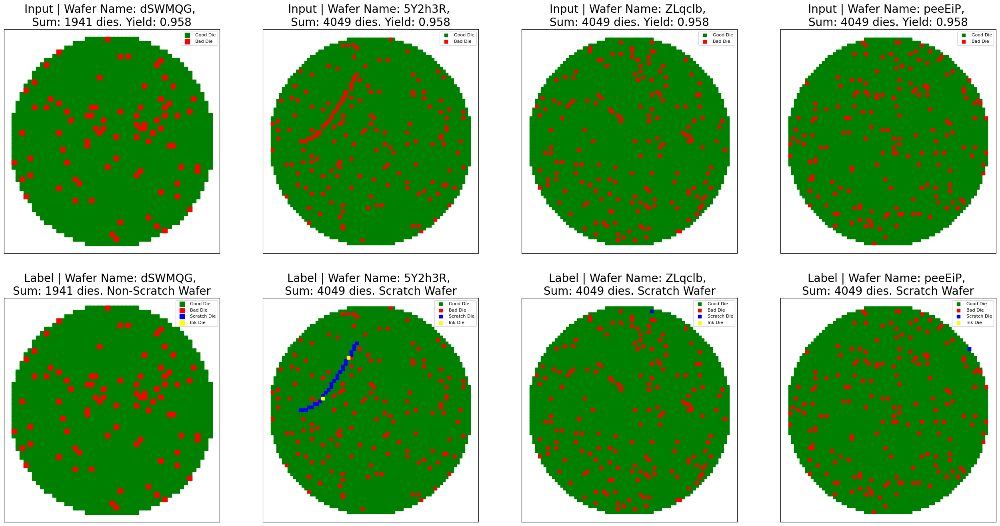

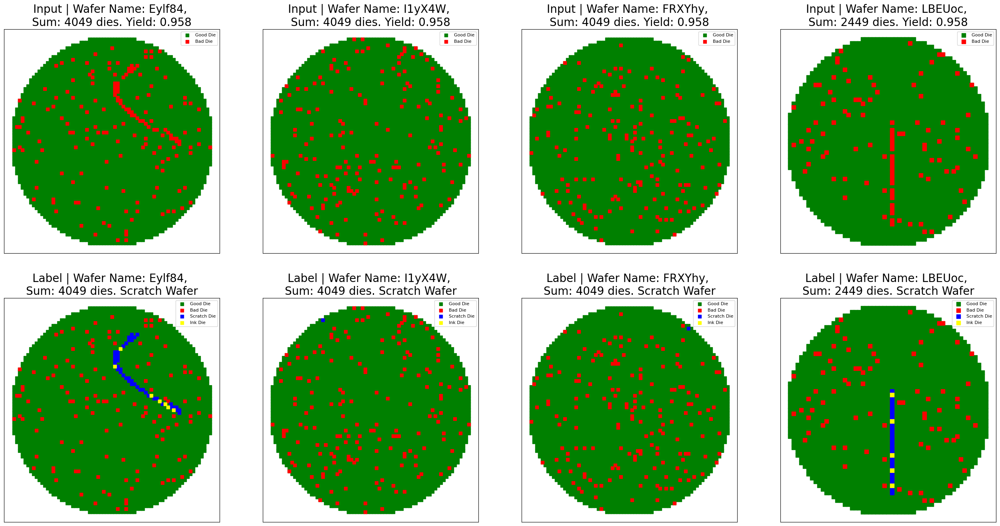

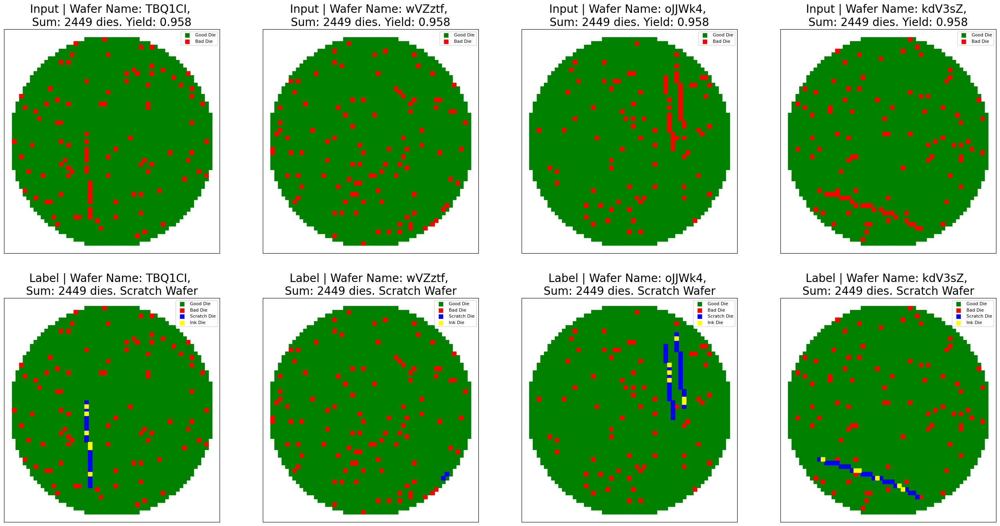

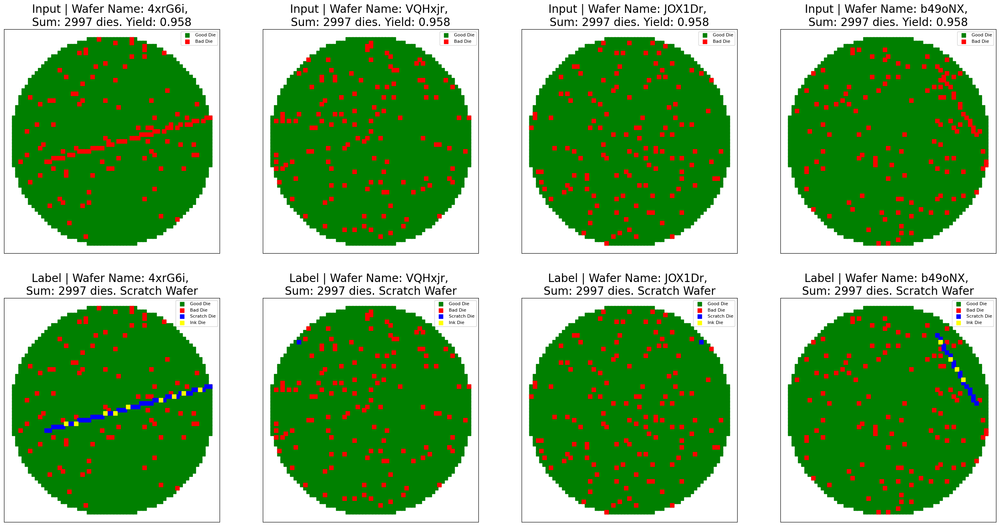

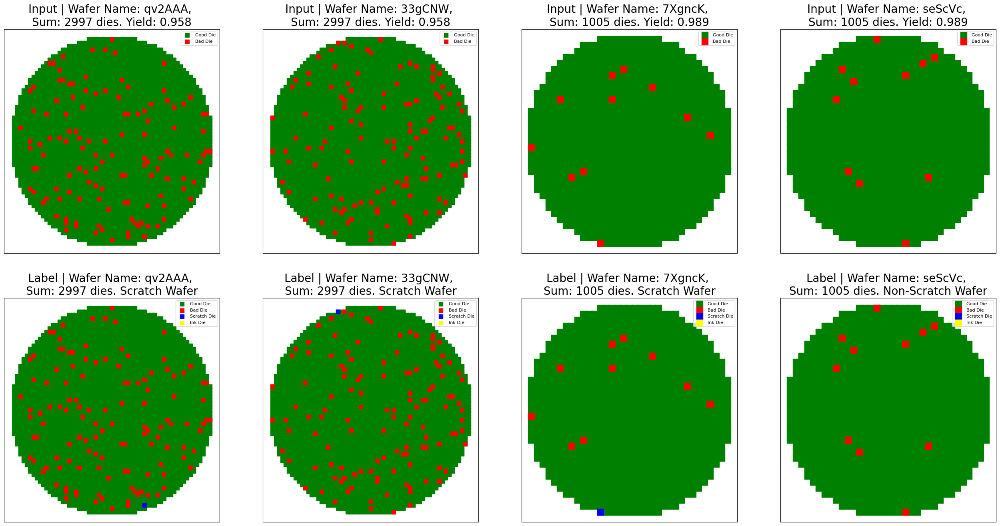

In [ ]:
#EDA: for trainset
num_wafers = df_wafers['WaferName'].nunique()
print(f"Number of unique wafers: {num_wafers}")

# Check for missing values
print("\nMissing values per column:")
print(df_wafers.isnull().sum())

# Basic statistics
print("\nDescriptive statistics:")
print(df_wafers.describe(include='all'))

# Recalculate wafer yield percentage
wafer_yield = df_wafers.groupby('WaferName').agg(
    total=('IsGoodDie', 'count'),
    good=('IsGoodDie', lambda x: (x == True).sum())
)
wafer_yield['yield_percent'] = 100 * wafer_yield['good'] / wafer_yield['total']

# Count how many wafers fall into each yield percentage range (binning)
start_b = 88
bin_edges = range(start_b, 101)  # Bins from 90% to 100%
wafer_yield['yield_bin'] = pd.cut(wafer_yield['yield_percent'], bins=bin_edges, right=False)

# Count number of wafers per bin
bin_counts = wafer_yield['yield_bin'].value_counts().sort_index()

# Plotting: X = good die percentage range, Y = number of wafers
plt.figure(figsize=(8, 5))
bin_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Number of Wafers per Good Die Percentage Range")
plt.xlabel("Good Die Percentage (%)")
plt.ylabel("Number of Wafers")
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


for amount in bin_counts:
    print(f"[{start_b}-{start_b+1}]: {amount}")
    start_b += 1




df_wafers['HasScratch'] = df_wafers['IsScratchDie'].fillna(False)
scratch_vs_good = df_wafers.groupby('HasScratch')['IsGoodDie'].mean()
print("\n Avg. Good Die % by Scratch Presence:")
print(scratch_vs_good)
df_wafers.drop('HasScratch', axis=1, inplace=True)

df_wafers.groupby('WaferName')['DieX'].count().plot(kind='hist', bins=30, color='salmon', edgecolor='black')
plt.title("Distribution of Wafer Sizes (Number of Dies)")
plt.xlabel("Number of Dies per Wafer")
plt.ylabel("Count")
plt.grid(axis='y')
plt.show()

unique_sizes = {}
for size in df_wafers.groupby('WaferName')['DieX'].count():
    if size not in unique_sizes:
        unique_sizes[size] = 1
    else:
        unique_sizes[size] += 1

print("Exact sizes and wafer counts:")
for size in sorted(unique_sizes):
    print(f"Wafer size: {size} dies -> {unique_sizes[size]} wafers")


# First: create a new column with wafer size per row
wafer_sizes = df_wafers.groupby('WaferName')['DieX'].count().to_dict()
df_wafers['WaferSize'] = df_wafers['WaferName'].map(wafer_sizes)

# Now calculate defect rate per size
defect_rates = df_wafers.groupby('WaferSize')['IsGoodDie'].apply(lambda x: 100 * (x == False).sum() / x.count())

# Plot
defect_rates.sort_index().plot(kind='bar', color='tomato', edgecolor='black')
plt.title("Average Defect Rate by Wafer Size")
plt.xlabel("Wafer Size (Number of Dies)")
plt.ylabel("Defect Rate (%)")
plt.grid(axis='y')
plt.tight_layout()
plt.show()

print(defect_rates.sort_index())


scratch_rates = df_wafers.groupby('WaferSize')['IsScratchDie'].apply(lambda x: 100 * x.fillna(False).sum() / x.count())

# Plot
scratch_rates.sort_index().plot(kind='bar', color='steelblue', edgecolor='black')
plt.title("Average Scratch Rate by Wafer Size")
plt.xlabel("Wafer Size (Number of Dies)")
plt.ylabel("Scratch Rate (%)")
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Calculate min/max DieX and DieY for each wafer size
wafer_bounds = df_wafers.groupby("WaferSize").agg(
    min_DieX=('DieX', 'min'),
    max_DieX=('DieX', 'max'),
    min_DieY=('DieY', 'min'),
    max_DieY=('DieY', 'max')
)

# Display
print("Min/Max DieX and DieY by Wafer Size:")
print(wafer_bounds)


print(scratch_rates.sort_index())

wafer_subset = wafer_yield[
    ((wafer_yield['yield_percent'] >= 90) & (wafer_yield['yield_percent'] < 93)) |
    ((wafer_yield['yield_percent'] >= 95.7) & (wafer_yield['yield_percent'] < 95.8)) |
    ((wafer_yield['yield_percent'] >= 98.85) & (wafer_yield['yield_percent'] < 99))
].copy()

# Sort by yield (ascending)
wafer_subset = wafer_subset.sort_values(by='yield_percent')

print("\nWafers in 90%-93%, 95.7%-95.8%, 98.85%-99% yield range (sorted):")
print(wafer_subset[['yield_percent']])

# Extract die data
df_low_yield_wafers = df_wafers[df_wafers['WaferName'].isin(wafer_subset.index)]

# Split into chunks of 4 for plotting
wafer_names = list(wafer_subset.index)
chunk_size = 4
for i in range(0, len(wafer_names), chunk_size):
    chunk_names = wafer_names[i:i+chunk_size]
    wafer_dfs = [df_low_yield_wafers[df_low_yield_wafers['WaferName'] == name] for name in chunk_names]
    plot_wafer_maps(wafer_dfs, figsize=8, labels=True)

In [ ]:
# Preprocessing: from wafer to 72X72 image
# I do it because i will use UNet/CNN
# 72X72 image - min x,y = (0,0) max x,y = (70,70)
def process_wafer_dataframe(df, has_labels=True, image_size=72):
    """
    Converts a wafer DataFrame into image tensors for model input.

    Parameters:
    - df: pandas DataFrame containing wafer data (train or test)
    - has_labels: bool, True if the data includes 'IsScratchDie' labels
    - image_size: int, output image dimensions (default: 72)

    Returns:
    - images: list of 72x72 numpy arrays (1 for bad die, 0 otherwise)
    - labels: list of 72x72 numpy arrays (1 for scratch, 0 otherwise), or None if test
    - masks: list of 72x72 numpy arrays (1 for valid die positions, 0 for background)
    - names: list of wafer names, one per image
    """
    wafer_map = {wafer: wafer_df for wafer, wafer_df in df.groupby("WaferName")}
    images, labels, masks, names = [], [], [], []

    for wafer_name, wafer_df in wafer_map.items():
        image = np.zeros((image_size, image_size), dtype=np.uint8)
        label = np.zeros((image_size, image_size), dtype=np.uint8) if has_labels else None
        mask = np.zeros((image_size, image_size), dtype=np.uint8)

        for _, row in wafer_df.iterrows():
            x, y = int(row['DieX']), int(row['DieY'])
            if x < image_size and y < image_size:
                image[y, x] = 1 if not row['IsGoodDie'] else 0
                mask[y, x] = 1
                if has_labels:
                    label[y, x] = 1 if row['IsScratchDie'] else 0

        images.append(image)
        masks.append(mask)
        labels.append(label) if has_labels else None
        names.append(wafer_name)

    return images, labels if has_labels else None, masks, names

images, labels , masks, names = process_wafer_dataframe(df_wafers)


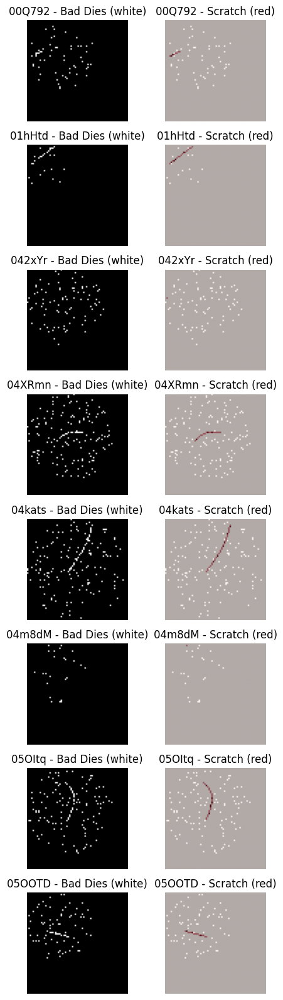

In [ ]:
# Plot e.g
def plot_wafer_images(images, labels, names, num=6):
    plt.figure(figsize=(5, 2 * num))
    for i in range(min(num, len(images))):
        plt.subplot(num, 2, 2*i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(f"{names[i]} - Bad Dies (white)")
        plt.axis('off')

        plt.subplot(num, 2, 2*i + 2)
        plt.imshow(images[i], cmap='gray')
        plt.imshow(labels[i], cmap='Reds', alpha=0.7)  # Scratch highlighted in red
        plt.title(f"{names[i]} - Scratch (red)")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

plot_wafer_images(images, labels, names, num=8)


In [ ]:
# Split the dataset by wafer names into train and test sets (80% train, 20% test)
train_names, test_names = train_test_split(names, test_size=0.2, random_state=42)

# Helper function: filters data by a list of wafer names
def filter_by_names(target_names):
    idxs = [i for i, name in enumerate(names) if name in target_names]
    return [images[i] for i in idxs], [labels[i] for i in idxs], [masks[i] for i in idxs]

# Apply the filter to create train and test datasets
train_imgs, train_lbls, train_masks = filter_by_names(train_names)
test_imgs, test_lbls, test_masks = filter_by_names(test_names)


In [ ]:


class WaferSegmentationDataset(Dataset):
    def __init__(self, images, labels, masks):
        self.images = images
        self.labels = labels
        self.masks = masks

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        X = torch.tensor(self.images[idx], dtype=torch.float32).unsqueeze(0)  # [1, 72, 72]
        y = torch.tensor(self.labels[idx], dtype=torch.float32).unsqueeze(0)  # [1, 72, 72]
        mask = torch.tensor(self.masks[idx], dtype=torch.float32).unsqueeze(0)  # [1, 72, 72]
        return X, y, mask


class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(UNet, self).__init__()

        # Downsampling
        self.enc1 = self.conv_block(in_channels, 32)
        self.pool1 = nn.MaxPool2d(2)  # 72 -> 36

        self.enc2 = self.conv_block(32, 64)
        self.pool2 = nn.MaxPool2d(2)  # 36 -> 18

        # Bottleneck
        self.bottleneck = self.conv_block(64, 128)

        # Upsampling
        self.up2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)  # 18 -> 36
        self.dec2 = self.conv_block(128, 64)

        self.up1 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)   # 36 -> 72
        self.dec1 = self.conv_block(64, 32)

        # Final output
        self.final = nn.Conv2d(32, out_channels, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)      # [B, 32, 72, 72]
        p1 = self.pool1(e1)    # [B, 32, 36, 36]

        e2 = self.enc2(p1)     # [B, 64, 36, 36]
        p2 = self.pool2(e2)    # [B, 64, 18, 18]

        # Bottleneck
        b = self.bottleneck(p2)  # [B, 128, 18, 18]

        # Decoder
        u2 = self.up2(b)         # [B, 64, 36, 36]
        d2 = self.dec2(torch.cat([u2, e2], dim=1))

        u1 = self.up1(d2)        # [B, 32, 72, 72]
        d1 = self.dec1(torch.cat([u1, e1], dim=1))

        return torch.sigmoid(self.final(d1))  # [B, 1, 72, 72]


In [ ]:
# Loss functions:
def masked_dice_loss(preds, targets, mask, epsilon=1e-6):
    # Flatten all tensors
    preds = preds.view(-1)
    targets = targets.view(-1)
    mask = mask.view(-1)

    # Keep only valid (masked) positions
    preds = preds[mask == 1]
    targets = targets[mask == 1]

    # Compute Dice coefficient
    intersection = (preds * targets).sum()
    union = preds.sum() + targets.sum()

    dice = (2. * intersection + epsilon) / (union + epsilon)
    return 1 - dice

def masked_bce_loss(preds, targets, mask):
    # Compute BCE loss per pixel (no reduction)
    bce = nn.BCELoss(reduction='none')
    loss = bce(preds, targets)

    # Apply mask to ignore background pixels
    loss = loss * mask
    return loss.sum() / (mask.sum() + 1e-6)

def train_one_epoch(model, dataloader, optimizer, device, dice_weight=0.5):
    model.train()
    total_loss = 0

    for X, y, mask in dataloader:
        X = X.to(device).float()        # [B, 1, 72, 72]
        y = y.to(device).float()
        mask = mask.to(device).float()

        optimizer.zero_grad()
        preds = model(X)                # Forward pass

        loss_dice = masked_dice_loss(preds, y, mask)
        loss_bce = masked_bce_loss(preds, y, mask)

        # Combine BCE and Dice loss using the given weight
        loss = (1-dice_weight) * loss_bce + dice_weight * loss_dice


        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(dataloader)


In [ ]:
# Create dataset using training images, labels, and masks
dataset = WaferSegmentationDataset(train_imgs, train_lbls, train_masks)

# Wrap the dataset in a DataLoader to enable mini-batch training and shuffling
loader = DataLoader(dataset, batch_size=8, shuffle=True)

In [ ]:
# CV - choose hyperparameters for Loss - dice_weights
def run_single_fold_per_dice_weight(images, labels, masks, names, model_class, dice_weights, thresholds, device='cpu'):
    name_array = np.array(names)
    kf = KFold(n_splits=len(dice_weights), shuffle=True, random_state=42)

    results = []

    # Loop over each fold + corresponding dice weight
    for (fold_num, (train_idx, val_idx)), dice_weight in zip(enumerate(kf.split(name_array), 1), dice_weights):
        print(f"\nFold {fold_num} using Dice Weight = {dice_weight}")

        # Split data by wafer name
        train_names = name_array[train_idx]
        val_names = name_array[val_idx]

        train_data = [(images[i], labels[i], masks[i]) for i in range(len(names)) if names[i] in train_names]
        val_data   = [(images[i], labels[i], masks[i]) for i in range(len(names)) if names[i] in val_names]

        # Wrap data in PyTorch datasets and loaders
        train_ds = WaferSegmentationDataset(*zip(*train_data))
        val_ds   = WaferSegmentationDataset(*zip(*val_data))

        train_loader = DataLoader(train_ds, batch_size=8, shuffle=True)
        val_loader = DataLoader(val_ds, batch_size=1, shuffle=False)

        # Initialize a new model
        model = model_class().to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

        # Train for 5 epochs
        for epoch in range(5):  # short for demonstration
            train_one_epoch(model, train_loader, optimizer, device, dice_weight)
            print(f"    Epoch {epoch+1}/{5}")

        # Collect predictions on validation set
        all_preds, all_targets, all_masks = [], [], []
        model.eval()
        with torch.no_grad():
            for X, y, mask in val_loader:
                X, y, mask = X.to(device), y.to(device), mask.to(device)
                pred = model(X)

                all_preds.append(pred.cpu().numpy())
                all_targets.append(y.cpu().numpy())
                all_masks.append(mask.cpu().numpy())
        # Flatten predictions and apply mask
        y_pred = np.concatenate(all_preds).reshape(-1)
        y_true = np.concatenate(all_targets).reshape(-1)
        y_mask = np.concatenate(all_masks).reshape(-1)

        y_true_masked = y_true[y_mask == 1]
        y_pred_masked = y_pred[y_mask == 1]

        # Loop over thresholds
        for t in thresholds:
            y_bin = (y_pred_masked > t).astype(int)
            prec = precision_score(y_true_masked, y_bin, zero_division=0)
            rec  = recall_score(y_true_masked, y_bin, zero_division=0)

            results.append({
                'fold': fold_num,
                'dice_weight': dice_weight,
                'threshold': t,
                'precision': prec,
                'recall': rec
            })

    return pd.DataFrame(results)



dice_weights = [0.0, 0.2, 0.5, 0.7, 0.9]
thresholds = [0.1,0.2,0.3,0.4, 0.5, 0.6, 0.7, 0.75, 0.8, 0.9, 0.95, 0.98, 0.99]
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
df_results = run_single_fold_per_dice_weight(train_imgs, train_lbls, train_masks, train_names, UNet, dice_weights, thresholds, device)



→ Fold 1 using Dice Weight = 0.0
    Epoch 1/5
    Epoch 2/5
    Epoch 3/5
    Epoch 4/5
    Epoch 5/5

→ Fold 2 using Dice Weight = 0.2
    Epoch 1/5
    Epoch 2/5
    Epoch 3/5
    Epoch 4/5
    Epoch 5/5

→ Fold 3 using Dice Weight = 0.5
    Epoch 1/5
    Epoch 2/5
    Epoch 3/5
    Epoch 4/5
    Epoch 5/5

→ Fold 4 using Dice Weight = 0.7
    Epoch 1/5
    Epoch 2/5
    Epoch 3/5
    Epoch 4/5
    Epoch 5/5

→ Fold 5 using Dice Weight = 0.9
    Epoch 1/5
    Epoch 2/5
    Epoch 3/5
    Epoch 4/5
    Epoch 5/5


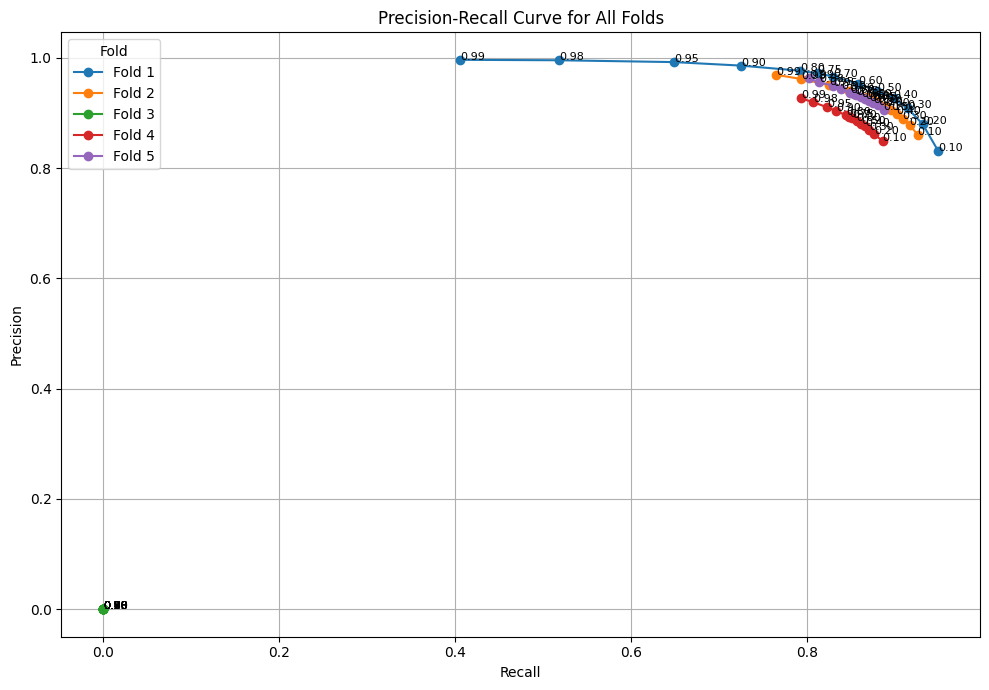

In [ ]:
# Create a single plot for all folds
plt.figure(figsize=(10, 7))

# Get unique folds
folds = sorted(df_results['fold'].unique())

# Plot each fold's precision-recall curve
for fold in folds:
    subset = df_results[df_results['fold'] == fold]
    plt.plot(subset['recall'], subset['precision'], marker='o', label=f'Fold {fold}')

    # Annotate each point with its threshold
    for _, row in subset.iterrows():
        plt.text(row['recall'], row['precision'], f"{row['threshold']:.2f}", fontsize=8)

# Final plot settings
plt.title('Precision-Recall Curve for All Folds')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.grid(True)
plt.legend(title='Fold')
plt.tight_layout()
plt.show()


In [ ]:
# We see that Fold 1 has the best AUC - dice_weights = 0.0
# Set device to GPU if available, otherwise use CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the model and move it to the selected device
model = UNet().to(device)

# Define the optimizer (Adam) with a learning rate of 1e-3
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# Number of training epochs
num_epochs = 5

# Train the model with the relevant hyperparameter - dice_weights = 0.0
for epoch in range(num_epochs):
    loss = train_one_epoch(model, loader, optimizer, device, 0.0)
    print(f"Epoch {epoch+1}/{num_epochs} - Loss: {loss:.4f}")


Epoch 1/5 - Loss: 0.0316
Epoch 2/5 - Loss: 0.0069
Epoch 3/5 - Loss: 0.0047
Epoch 4/5 - Loss: 0.0041
Epoch 5/5 - Loss: 0.0037



====== Threshold = 0.10 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.86      0.95      0.90     15355

    accuracy                           1.00   2057924
   macro avg       0.93      0.98      0.95   2057924
weighted avg       1.00      1.00      1.00   2057924



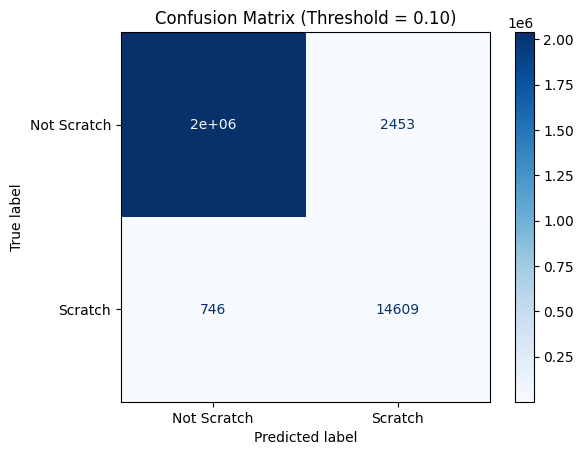


====== Threshold = 0.20 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.90      0.93      0.92     15355

    accuracy                           1.00   2057924
   macro avg       0.95      0.97      0.96   2057924
weighted avg       1.00      1.00      1.00   2057924



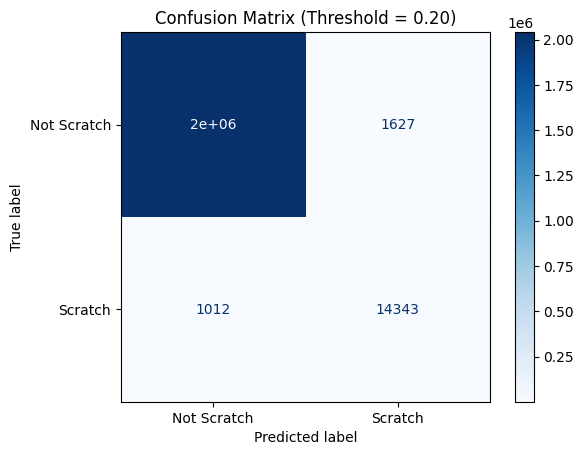


====== Threshold = 0.30 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.92      0.92      0.92     15355

    accuracy                           1.00   2057924
   macro avg       0.96      0.96      0.96   2057924
weighted avg       1.00      1.00      1.00   2057924



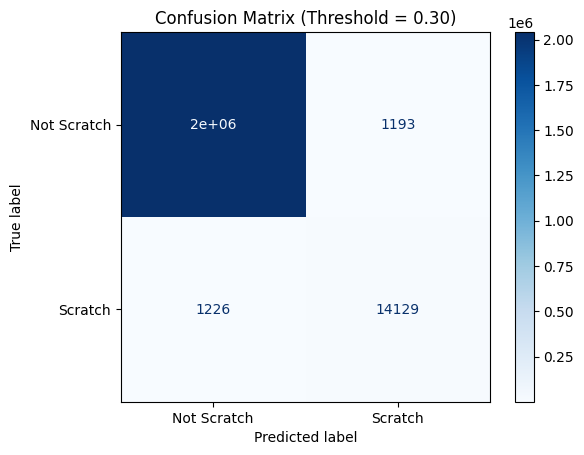


====== Threshold = 0.40 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.94      0.90      0.92     15355

    accuracy                           1.00   2057924
   macro avg       0.97      0.95      0.96   2057924
weighted avg       1.00      1.00      1.00   2057924



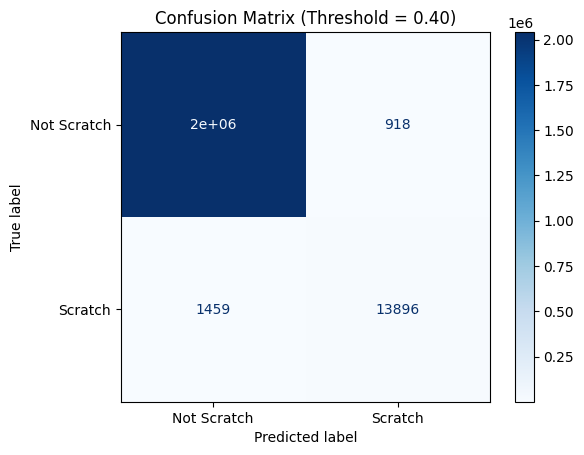


====== Threshold = 0.50 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.95      0.89      0.92     15355

    accuracy                           1.00   2057924
   macro avg       0.98      0.94      0.96   2057924
weighted avg       1.00      1.00      1.00   2057924



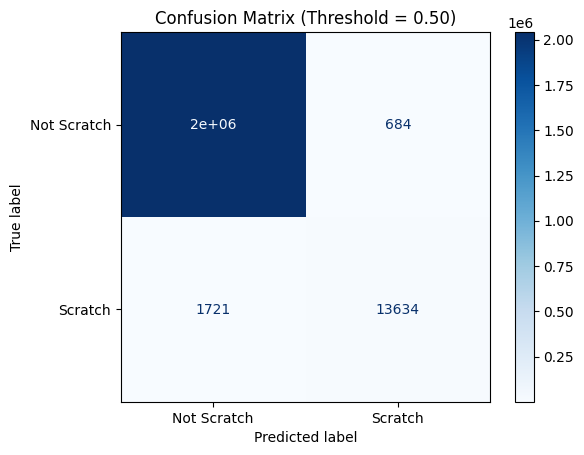


====== Threshold = 0.55 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.96      0.88      0.91     15355

    accuracy                           1.00   2057924
   macro avg       0.98      0.94      0.96   2057924
weighted avg       1.00      1.00      1.00   2057924



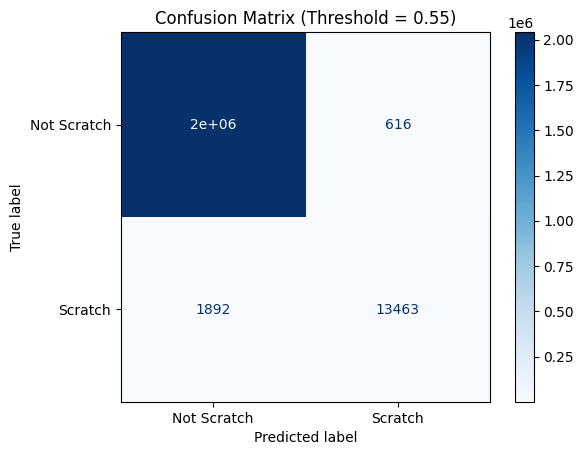


====== Threshold = 0.60 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.96      0.87      0.91     15355

    accuracy                           1.00   2057924
   macro avg       0.98      0.93      0.96   2057924
weighted avg       1.00      1.00      1.00   2057924



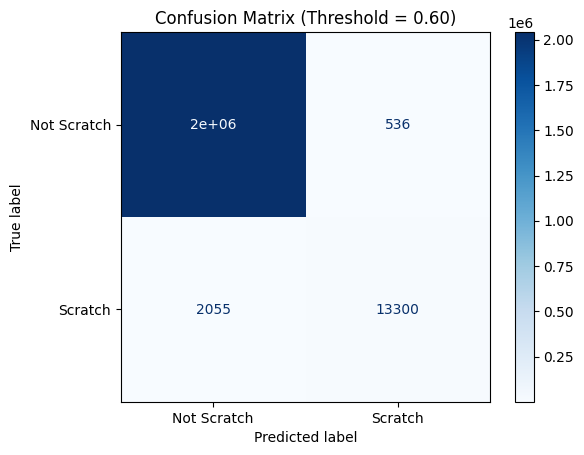


====== Threshold = 0.65 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.97      0.85      0.91     15355

    accuracy                           1.00   2057924
   macro avg       0.98      0.93      0.95   2057924
weighted avg       1.00      1.00      1.00   2057924



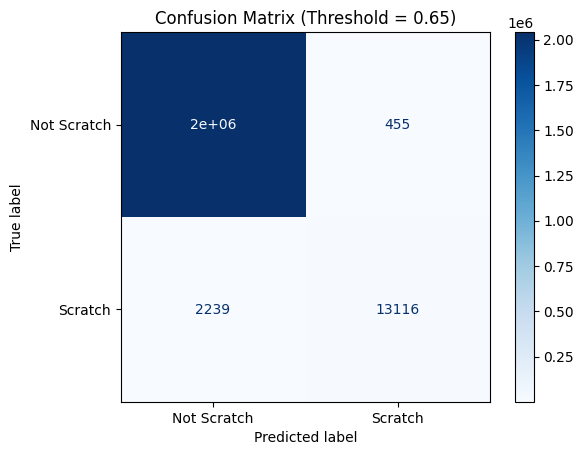


====== Threshold = 0.70 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.97      0.84      0.90     15355

    accuracy                           1.00   2057924
   macro avg       0.98      0.92      0.95   2057924
weighted avg       1.00      1.00      1.00   2057924



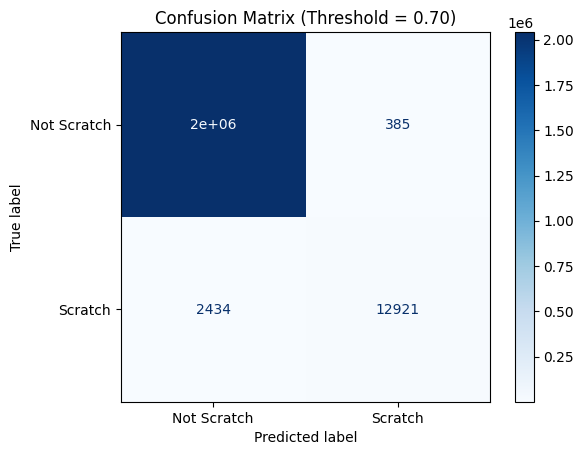


====== Threshold = 0.80 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.98      0.81      0.89     15355

    accuracy                           1.00   2057924
   macro avg       0.99      0.90      0.94   2057924
weighted avg       1.00      1.00      1.00   2057924



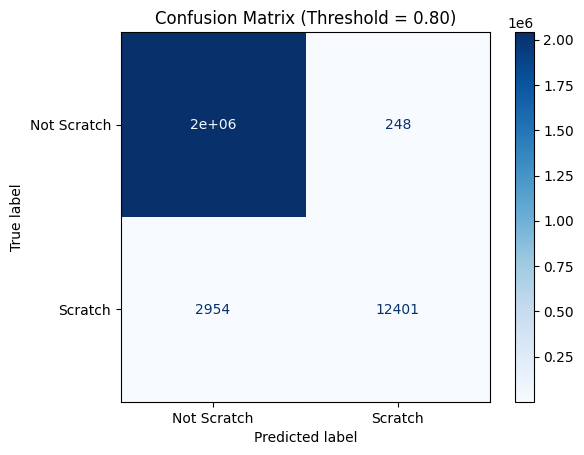


====== Threshold = 0.90 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.99      0.75      0.85     15355

    accuracy                           1.00   2057924
   macro avg       0.99      0.87      0.93   2057924
weighted avg       1.00      1.00      1.00   2057924



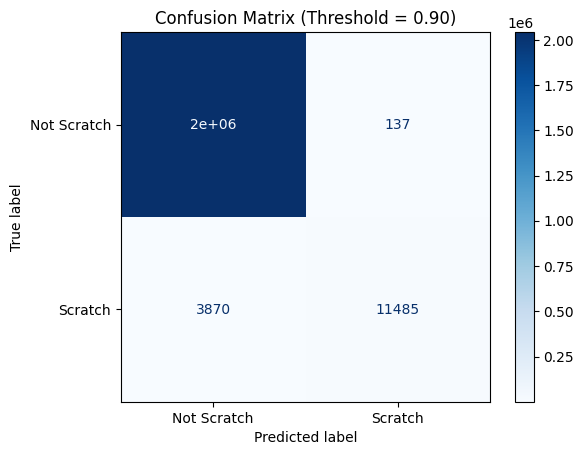


====== Threshold = 0.95 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       0.99      0.68      0.81     15355

    accuracy                           1.00   2057924
   macro avg       1.00      0.84      0.90   2057924
weighted avg       1.00      1.00      1.00   2057924



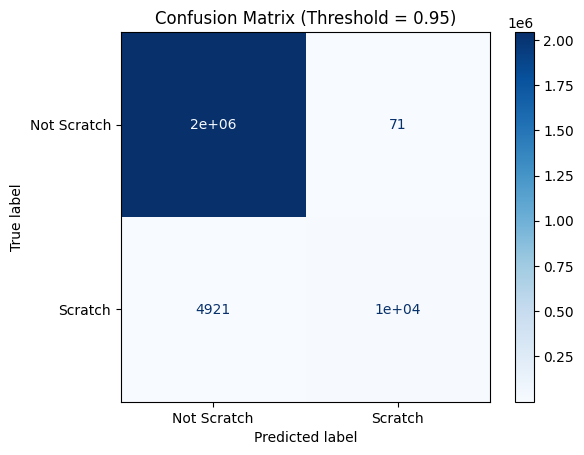


====== Threshold = 0.98 ======
              precision    recall  f1-score   support

 Not Scratch       1.00      1.00      1.00   2042569
     Scratch       1.00      0.56      0.72     15355

    accuracy                           1.00   2057924
   macro avg       1.00      0.78      0.86   2057924
weighted avg       1.00      1.00      1.00   2057924



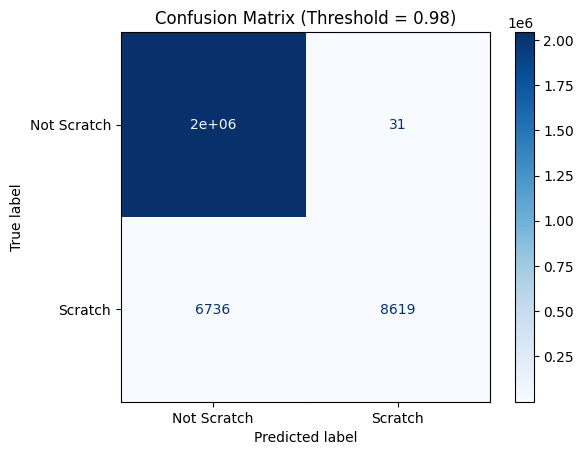

In [ ]:
# Train the relevant model to chose the right treshold
# Create test dataset and DataLoader
test_dataset = WaferSegmentationDataset(test_imgs, test_lbls, test_masks)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Store predictions, targets, and masks in advance (to avoid recomputing)
all_preds = []
all_targets = []
all_masks = []

# Set model to evaluation mode
model.eval()
with torch.no_grad():
    for X, y, mask in test_loader:
        X, y, mask = X.to(device), y.to(device), mask.to(device)
        pred = model(X)
        all_preds.append(pred.cpu().numpy())
        all_targets.append(y.cpu().numpy())
        all_masks.append(mask.cpu().numpy())

# Flatten predictions, targets, and masks into 1D arrays
y_pred_all = np.concatenate(all_preds).reshape(-1)
y_true_all = np.concatenate(all_targets).reshape(-1)
mask_all   = np.concatenate(all_masks).reshape(-1)

# Filter only the valid dies (i.e., where mask == 1)
y_true_masked = y_true_all[mask_all == 1]
y_pred_masked_raw = y_pred_all[mask_all == 1]

# Evaluate at different threshold values
thresholds = [0.1,0.2,0.3,0.4, 0.5,0.55, 0.6, 0.65, 0.7, 0.8, 0.9, 0.95, 0.98]

for t in thresholds:
    print(f"\n====== Threshold = {t:.2f} ======")

    # Apply threshold to predictions
    y_pred_binary = (y_pred_masked_raw > t).astype(int)

    # Compute confusion matrix and display it
    cm = confusion_matrix(y_true_masked, y_pred_binary, labels=[0, 1])
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Scratch', 'Scratch'])

    # Print precision, recall, f1-score report
    print(classification_report(y_true_masked, y_pred_binary, target_names=['Not Scratch', 'Scratch']))
    disp.plot(cmap='Blues')
    plt.title(f"Confusion Matrix (Threshold = {t:.2f})")
    plt.show()



🔁 Fold 1/5
    Epoch 1/5
    Epoch 2/5
    Epoch 3/5
    Epoch 4/5
    Epoch 5/5


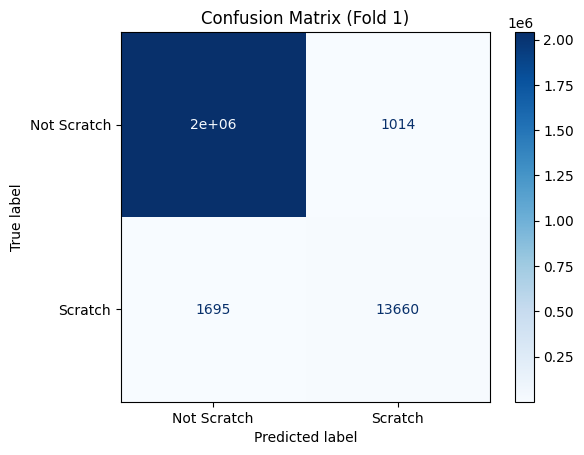


🔁 Fold 2/5
    Epoch 1/5
    Epoch 2/5
    Epoch 3/5
    Epoch 4/5
    Epoch 5/5


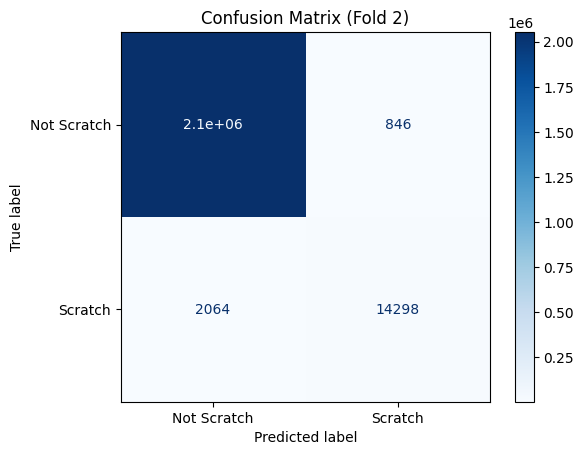


🔁 Fold 3/5
    Epoch 1/5
    Epoch 2/5
    Epoch 3/5
    Epoch 4/5
    Epoch 5/5


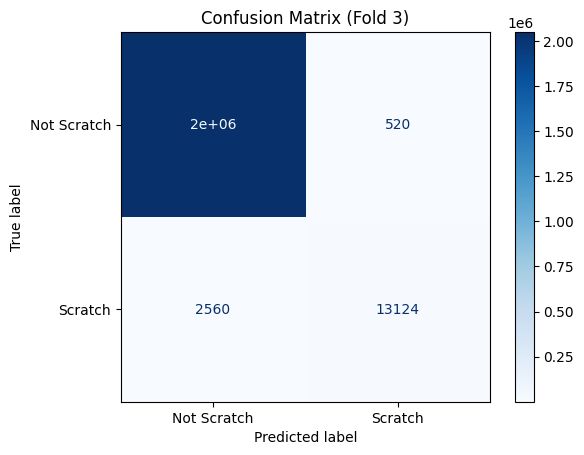


🔁 Fold 4/5
    Epoch 1/5
    Epoch 2/5
    Epoch 3/5
    Epoch 4/5
    Epoch 5/5


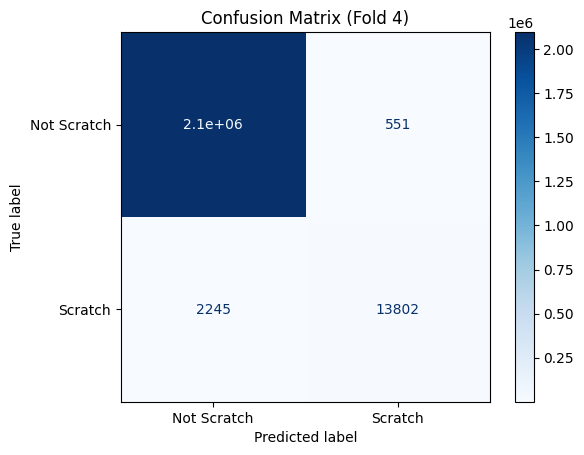


🔁 Fold 5/5
    Epoch 1/5
    Epoch 2/5
    Epoch 3/5
    Epoch 4/5
    Epoch 5/5


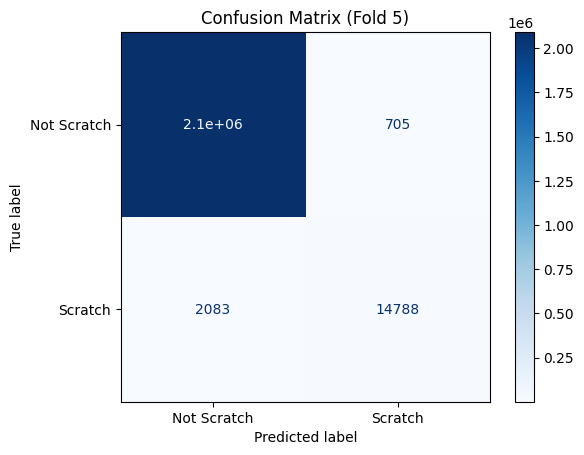

In [ ]:
# CV - to check the model is reliable with(threshold = 0.65 and dice_weight = 0.0)
def cross_validate_cm(images, labels, masks, names, model_class, dice_weight, threshold, device='cpu', k=5):
    name_array = np.array(names)
    kf = KFold(n_splits=k, shuffle=True, random_state=42)

    for fold_num, (train_idx, val_idx) in enumerate(kf.split(name_array), 1):
        print(f"\nFold {fold_num}/{k}")

        train_names = name_array[train_idx]
        val_names = name_array[val_idx]

        train_data = [(images[i], labels[i], masks[i]) for i in range(len(names)) if names[i] in train_names]
        val_data   = [(images[i], labels[i], masks[i]) for i in range(len(names)) if names[i] in val_names]

        train_ds = WaferSegmentationDataset(*zip(*train_data))
        val_ds   = WaferSegmentationDataset(*zip(*val_data))

        train_loader = DataLoader(train_ds, batch_size=8, shuffle=True)
        val_loader = DataLoader(val_ds, batch_size=1, shuffle=False)

        # Train model
        model = model_class().to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

        for epoch in range(5):
            train_one_epoch(model, train_loader, optimizer, device, dice_weight)
            print(f"    Epoch {epoch+1}/{5}")

        # Predict on validation set
        all_preds, all_targets, all_masks = [], [], []
        model.eval()
        with torch.no_grad():
            for X, y, mask in val_loader:
                X, y, mask = X.to(device), y.to(device), mask.to(device)
                pred = model(X)
                all_preds.append(pred.cpu().numpy())
                all_targets.append(y.cpu().numpy())
                all_masks.append(mask.cpu().numpy())

        # Flatten and apply mask
        y_pred = np.concatenate(all_preds).reshape(-1)
        y_true = np.concatenate(all_targets).reshape(-1)
        y_mask = np.concatenate(all_masks).reshape(-1)

        y_true_masked = y_true[y_mask == 1]
        y_pred_masked = (y_pred[y_mask == 1] > threshold).astype(int)

        # Confusion Matrix
        cm = confusion_matrix(y_true_masked, y_pred_masked, labels=[0, 1])
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Scratch', 'Scratch'])
        disp.plot(cmap='Blues')
        plt.title(f"Confusion Matrix (Fold {fold_num})")
        plt.grid(False)
        plt.show()


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
cross_validate_cm(images, labels, masks, names, UNet, dice_weight=0.0, threshold=0.65, device=device, k=5)



In [ ]:

test_imgs, _, test_masks, test_names = process_wafer_dataframe(df_wafers_test, has_labels=False)


In [ ]:
# Prepare to submission
final_test_dataset = WaferSegmentationDataset(test_imgs, test_masks, test_masks)  # dummy labels
final_test_loader = DataLoader(final_test_dataset, batch_size=1, shuffle=False)

model.eval()
all_preds = []
threshold = 0.65

with torch.no_grad():
    for X, _, _ in final_test_loader:
        X = X.to(device)
        pred = model(X)
        pred_bin = (pred > threshold).float()
        pred_mask = pred_bin.squeeze().cpu().numpy()  # [1,1,72,72] -> [72,72]
        all_preds.append(pred_mask)

wafer_map_test = {wafer: wafer_df for wafer, wafer_df in df_wafers_test.groupby("WaferName")}
df_wafers_test['IsScratchDie'] = 0
image_size = 72

wafer_yield = df_wafers_test.groupby('WaferName').agg(
    total=('IsGoodDie', 'count'),
    good=('IsGoodDie', lambda x: (x == True).sum())
)
wafer_yield['yield_percent'] = 100 * wafer_yield['good'] / wafer_yield['total']

for wafer_name, wafer_df in wafer_map_test.items():
    preds = []

    if wafer_yield.loc[wafer_name, 'yield_percent'] < 88:
        preds = [0] * len(wafer_df)

    else:
        pred_mask = all_preds[test_names.index(wafer_name)]

        for _, row in wafer_df.iterrows():
            x, y = int(row['DieX']), int(row['DieY'])
            if 0 <= x < image_size and 0 <= y < image_size:
                preds.append(int(pred_mask[y, x]))
            else:
                preds.append(0)


    df_wafers_test.loc[df_wafers_test['WaferName'] == wafer_name, 'IsScratchDie'] = preds

df_wafers_test['IsScratchDie'] = df_wafers_test['IsScratchDie'].astype(bool)

if 'WaferSize' in df_wafers_test.columns:
    df_wafers_test = df_wafers_test.drop('WaferSize', axis=1)

# Additional thoughts

Here you can detail about anything you want to mention as additional considerations for this solution, anything from ideas, thoughts, considerations about deployment or anything you may have raised when working on this task in a team.

In [ ]:
#TODO add your thoughts
# Project Workflow Summary:

# EDA (Exploratory Data Analysis):
# Checked missing values, wafer sizes, scratch/good die distribution, yield bins...

# Data Conversion to 72×72 Images:
# Converted die-level data into 72×72 image grids (images, labels, masks).

# Model Building (U-Net):
# Built a CNN segmentation model using U-Net architecture with BCE + Dice loss.

# Train/Test Split (80/20):
# Split wafers by name to ensure no data leakage.

# Cross-Validation for Hyperparameter Selection:
# Ran 5-fold CV with different dice_weight values and thresholds; plotted precision-recall.

# Cross-Validation for Model Reliability:
# Validated best model (e.g., dice_weight=0.0, threshold=0.65) using confusion matrices.

# Final Model Training:
# Trained the selected model on the full training set.

# Prediction on Test Data:
# Predicted scratch masks per wafer; wafers with yield < 88% were marked as scratch-free; saved results to CSV.


# thoughts:

#1
# Should we treat low-yield wafers differently?
# I chose to classify all wafers with yield < 88% as scratch-free after inspecting the test set and observing that,
# below this threshold, it's easy for the model to "imagine" scratches that aren't really there.
# This seems to be a business decision that the team should determine what yield threshold best balances.

#2
# Quality Optimization: trade-off between false negatives VS false positives
# Since the training data appears to be cleaner than the test data
# (e.g., yield distribution is more concentrated around 96% in training vs. a lot of wafers under 90% in test),
# I aimed to choose a model that is more conservative and selective in its predictions(a little bit in favore to pecision).
# The goal was to reduce the risk of false scratch predictions on less clean wafers in the test set.

#3
# Data Augmentation: (didn't do it - not enough GPU resources)
# Would adding more data augmentation improve model robustness?
# Beyond rotations by 90,180,270 angals, should we try synthetic defect generation?
# Could we try transferring or overlaying scratch patterns from one wafer onto another to simulate new examples?

#4 Existing models
# Should we explore existing pretrained segmentation models (e.g., from Hugging Face)?
# Leveraging such models might reduce training time and improve performance — especially if fine-tuned on our wafer data.

#5
# Model Limitation with Wafer Size
# If larger wafers are introduced in the future, our current model may not be compatible,
# as it was designed for a maximum input size of 72×72.
# Should we redesign the model to support dynamic or larger input sizes to improve scalability(e.g 128X128)?

# Submission

In [ ]:
#TODO Fill in your name and email
name = 'Yehonatan Yamin'
email = 'yehonatan19y@gmail.com'

#Dont change the following code
date_str = datetime.now().strftime('%Y%m%d')
filename = f"{date_str}_{name}_{email}_df_wafers_test_with_preds.csv"
df_wafers_test.to_csv(filename, index=False)
print("Saved file:", filename)

Saved file: 20250504_Yehonatan Yamin_yehonatan19y@gmail.com_df_wafers_test_with_preds.csv


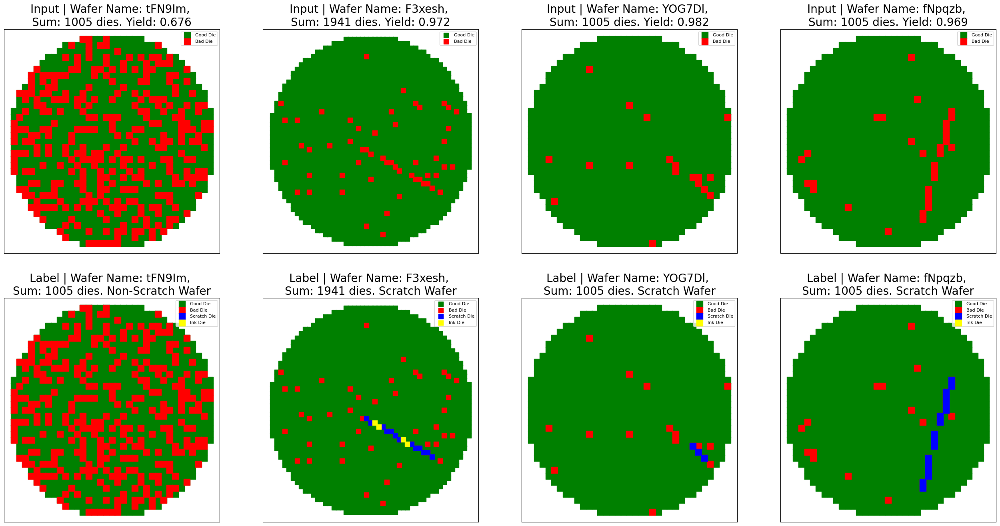

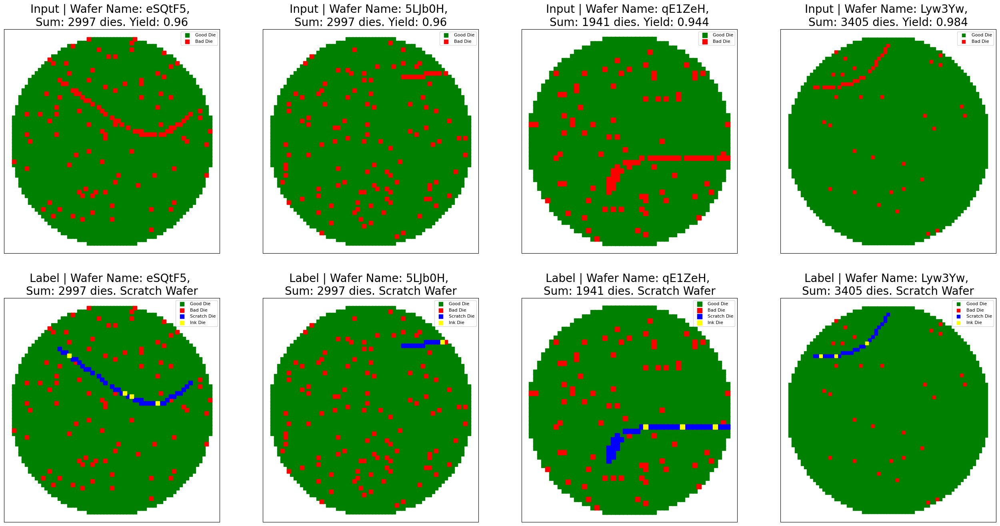

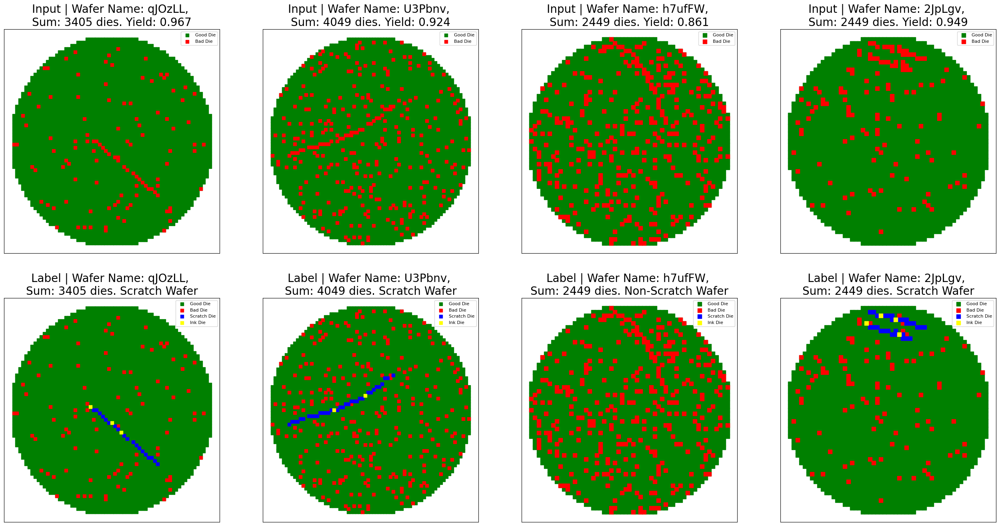

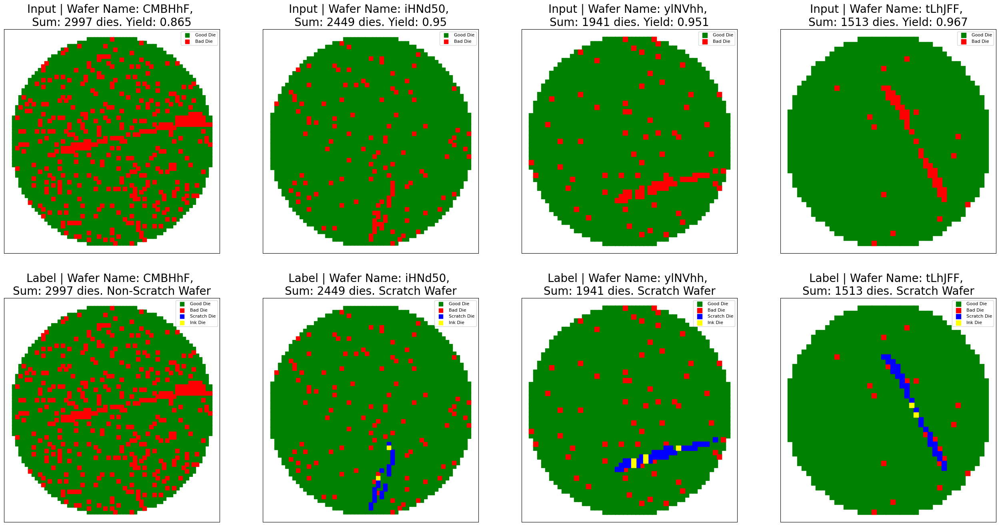

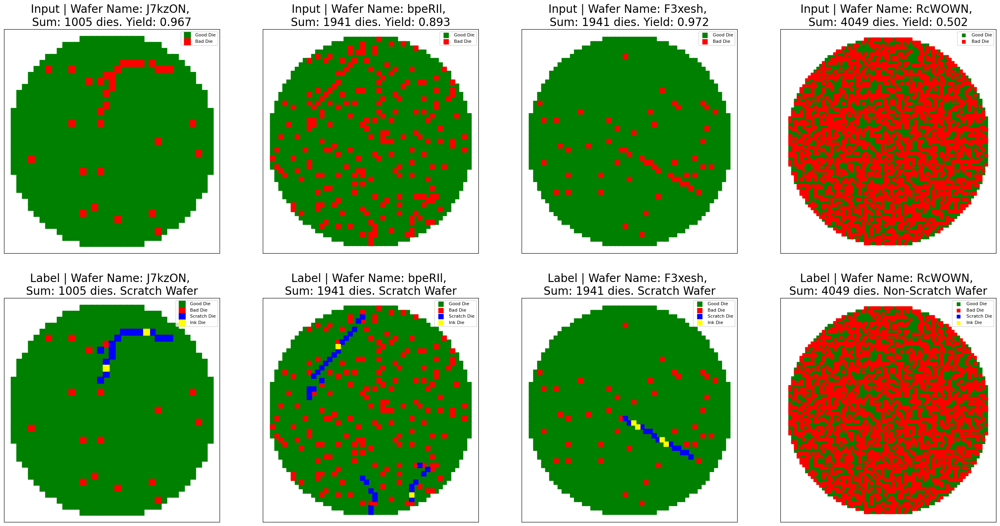

...

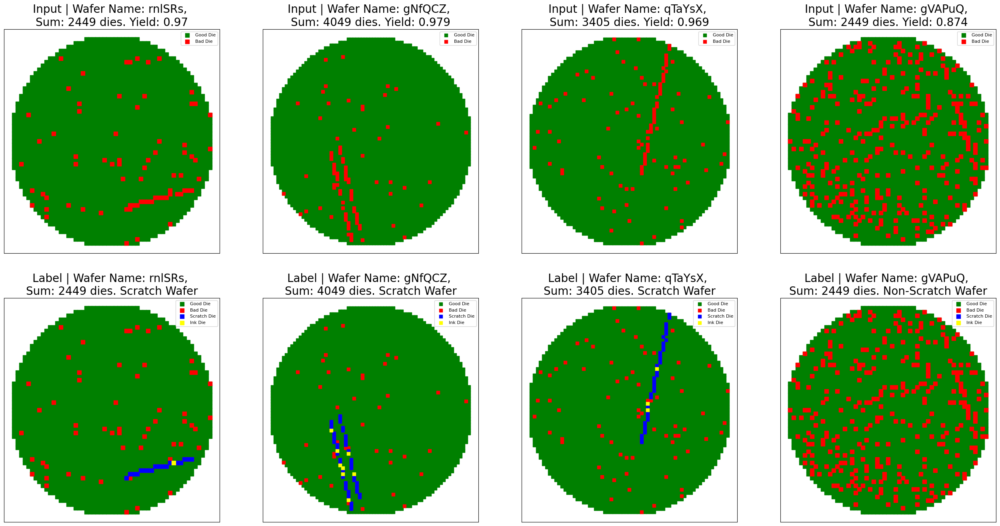

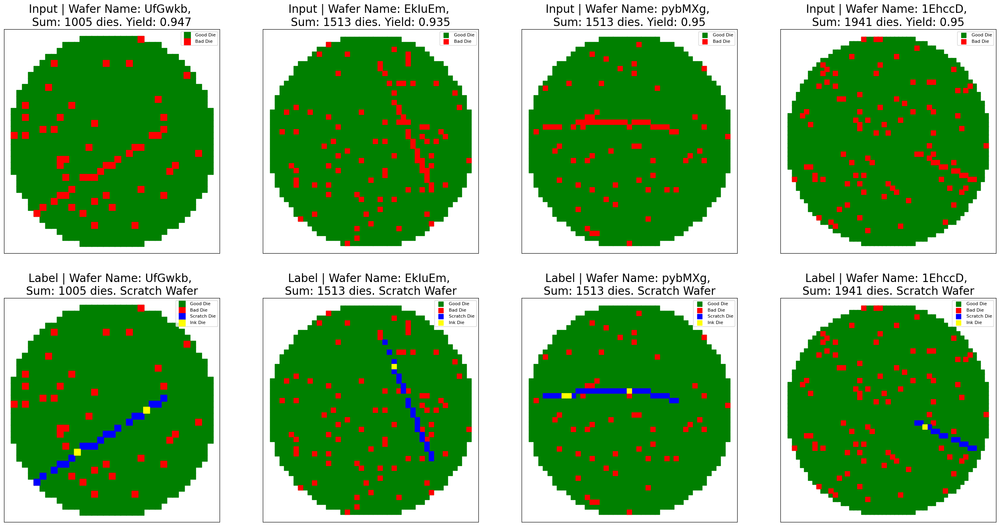

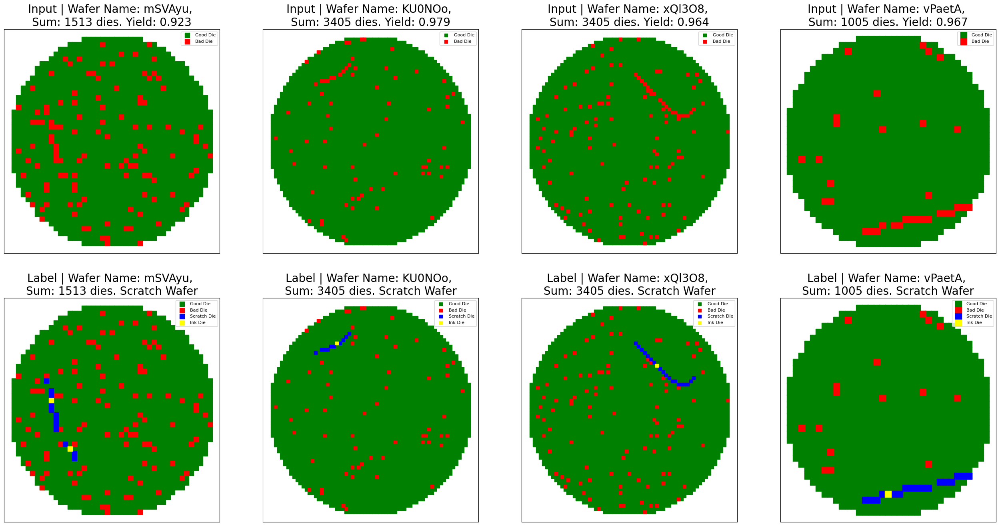

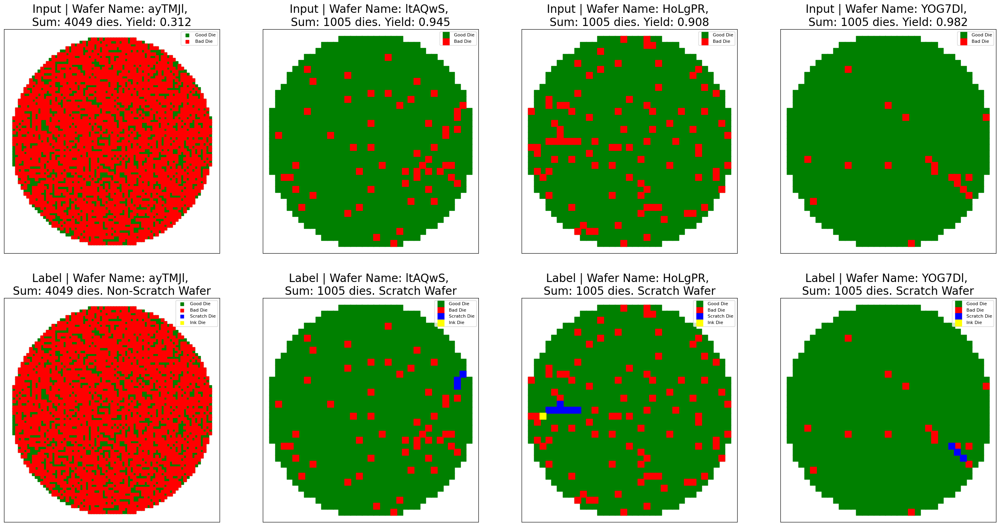

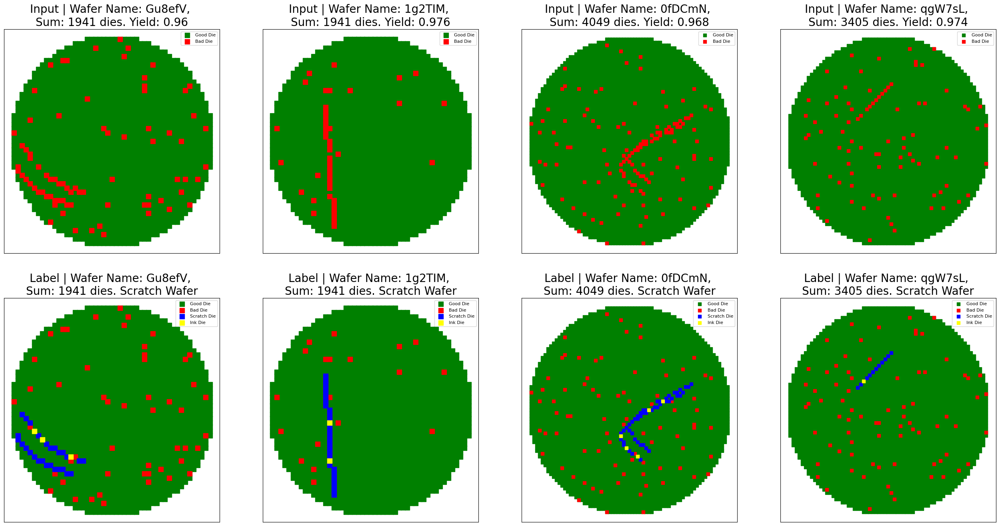

In [ ]:
# Some results – for wafers with yield under 88%, all dies are marked as not scratched (False)
n_samples = 4
for i in range(10):
  list_sample_train = [df_wafers_test.groupby('WaferName').get_group(group) for group in df_wafers_test['WaferName'].value_counts().sample(n_samples).index]
  plot_wafer_maps(list_sample_train, figsize = 8, labels = True)